In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import scipy.stats as stats
from sklearn.model_selection import train_test_split
import statsmodels.formula.api as smf
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from patsy import dmatrices 
import warnings
warnings.filterwarnings("ignore")

In [14]:
filepath = "C:\\Users\\sudhi\\OneDrive\\Desktop\\Analytics Labs\\Data Engineer\\Python\\Integrated Case Study\\"
file1 = "Sales_Shipment_Data.csv"
file2 = "Inventory_Stock_Data.csv"

In [15]:
sales = pd.read_csv(filepath + file1)
inve = pd.read_csv(filepath + file2)

# Data Audit
Number of rows & Number of columns

In [16]:
row=len(sales)
col=len(sales.columns)
print("Number of rows = ",row)
print("Number of columns = ",col)

Number of rows =  180519
Number of columns =  46


#
Number of numerical & categorical columns

In [17]:
numlen=len(sales.select_dtypes(exclude = 'object').columns)
collen=len(sales.select_dtypes(include = 'object').columns)
print("Number of Numerical columns = ",numlen)
print("Number of Categorical columns = ",collen)


Number of Numerical columns =  24
Number of Categorical columns =  22


In [18]:
#Order date and Shipping Date are in object data type
#Changing it to Datetime 

In [19]:
sales['order date (DateOrders)']=pd.to_datetime(sales['order date (DateOrders)'])

In [20]:
sales['shipping date (DateOrders)']=pd.to_datetime(sales['shipping date (DateOrders)'])

# 
Detailed EDA - Univariate & Bi Variate analysis for each variable (distributions)

In [12]:
#Univariate Analysis
#For Numerical Data
num = sales.select_dtypes(exclude='object')

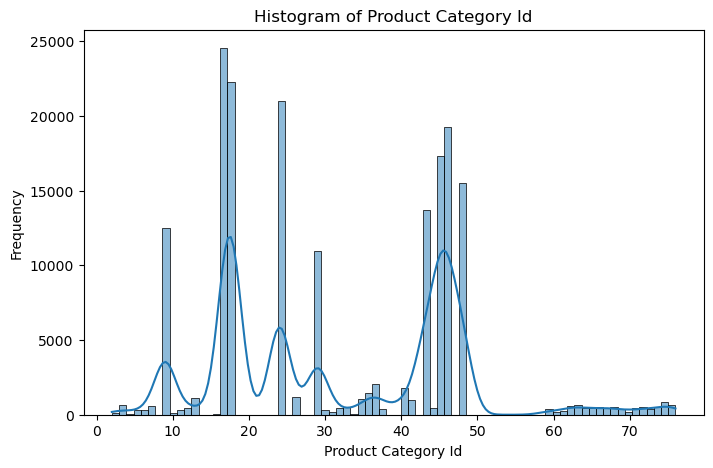

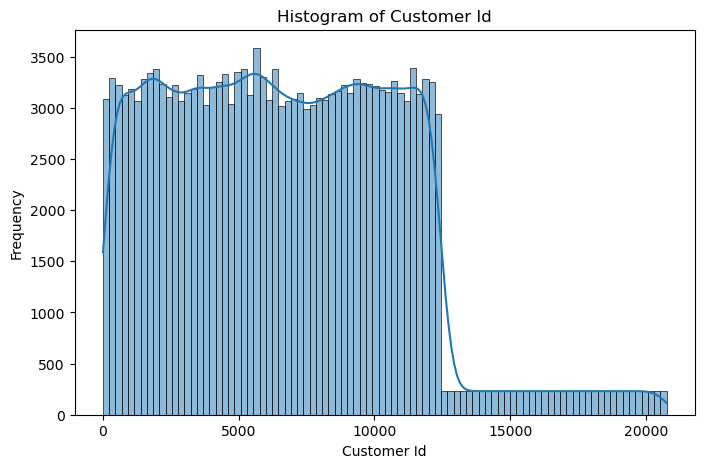

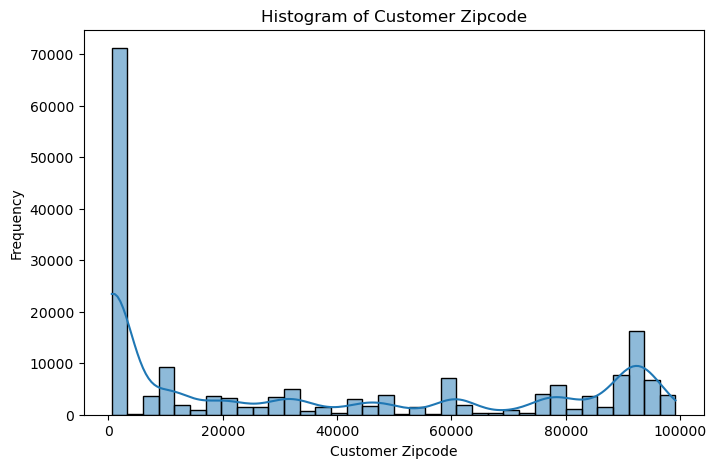

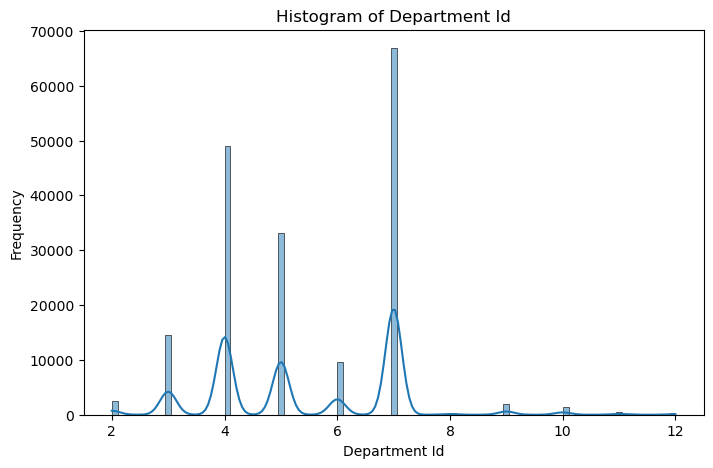

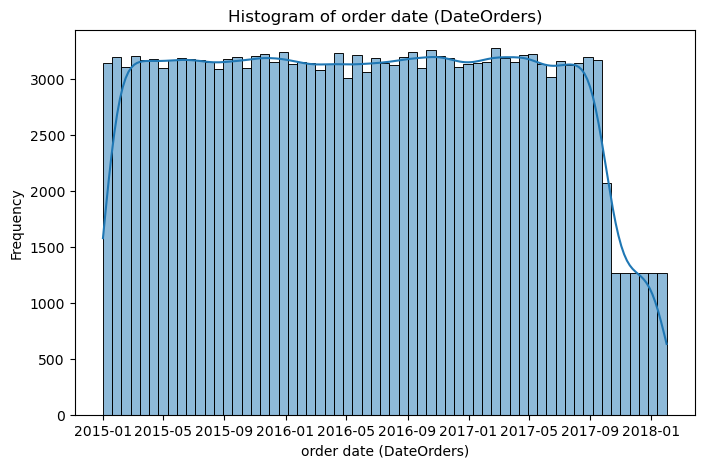

...

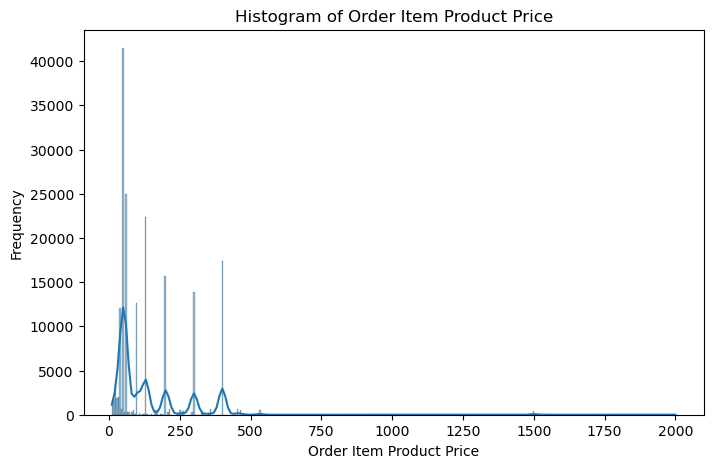

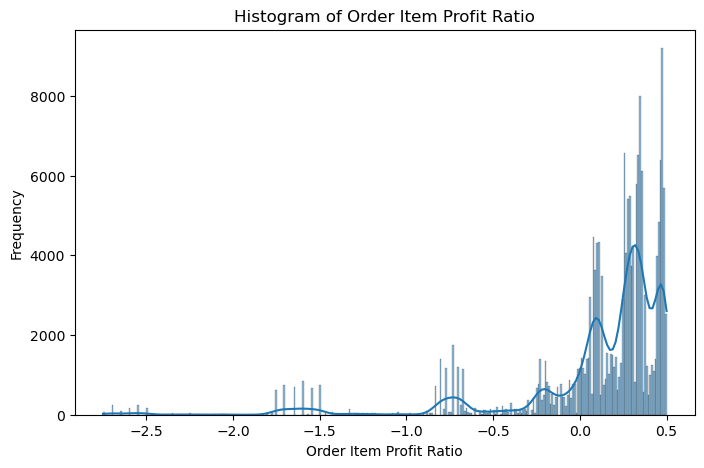

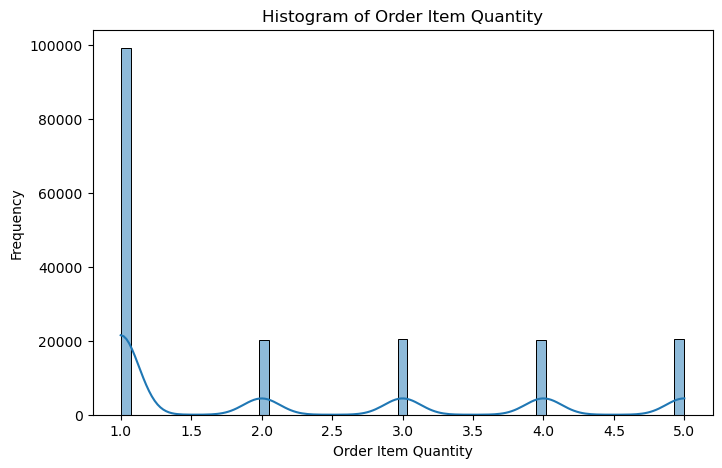

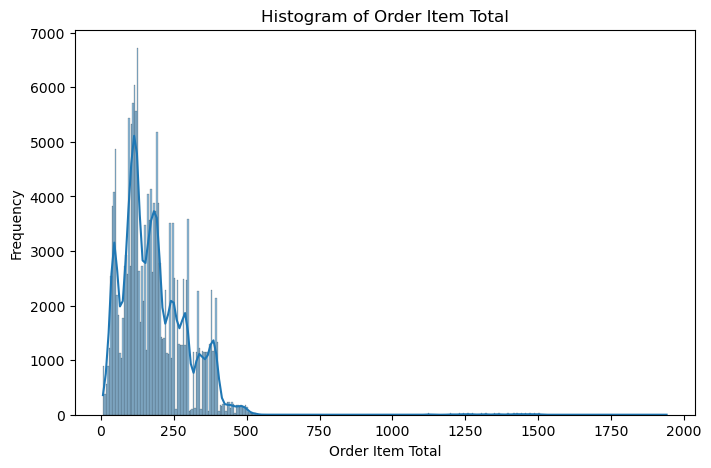

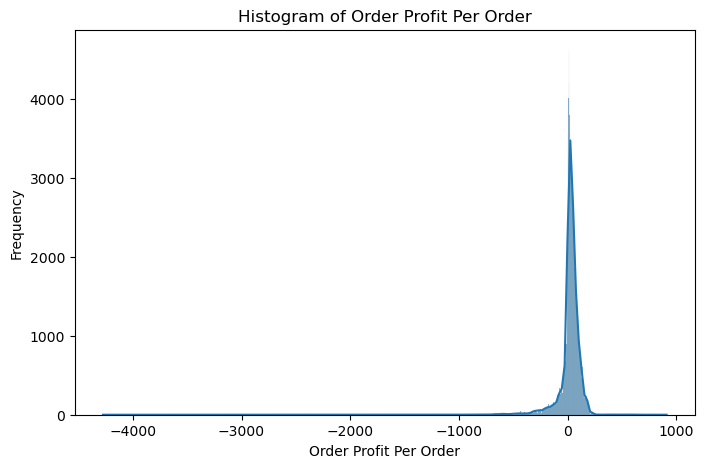

KeyboardInterrupt: 

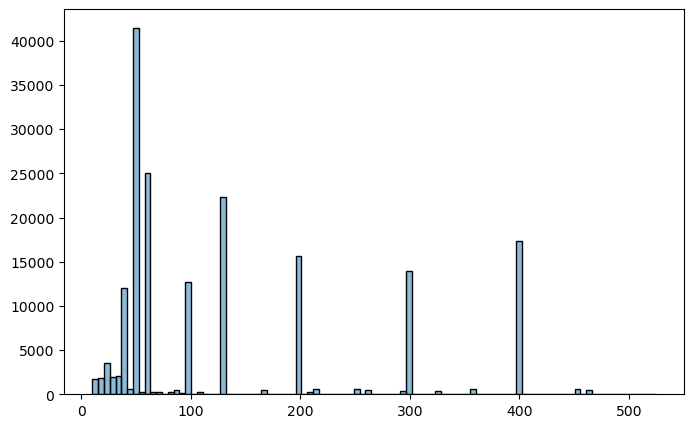

In [35]:
for column in num.columns:
    plt.figure(figsize=(8, 5))
    sns.histplot(data=sales, x=column, kde=True)
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

In [54]:
#Univariate Analysis
#For Categorical Data
cat = sales.select_dtypes(include='object')

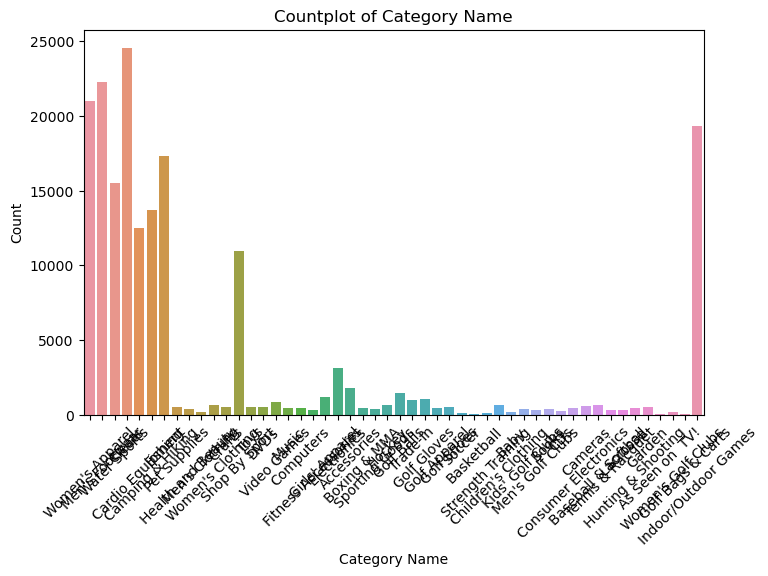

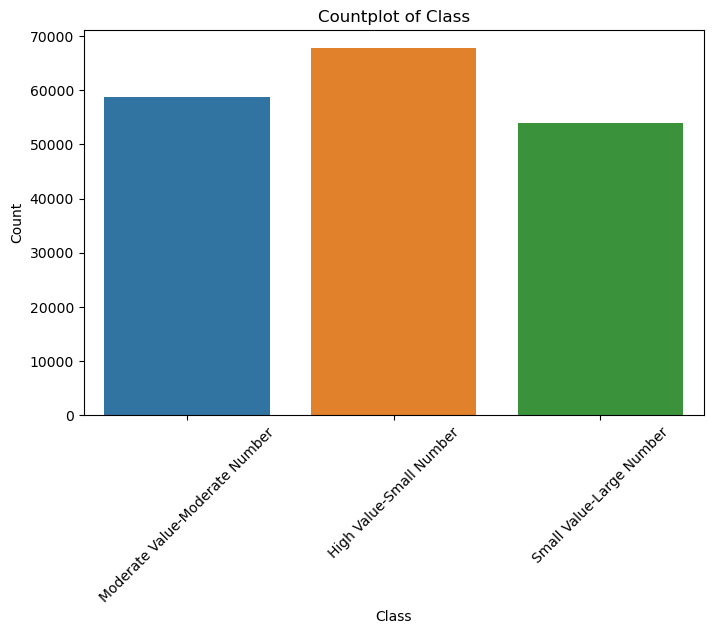

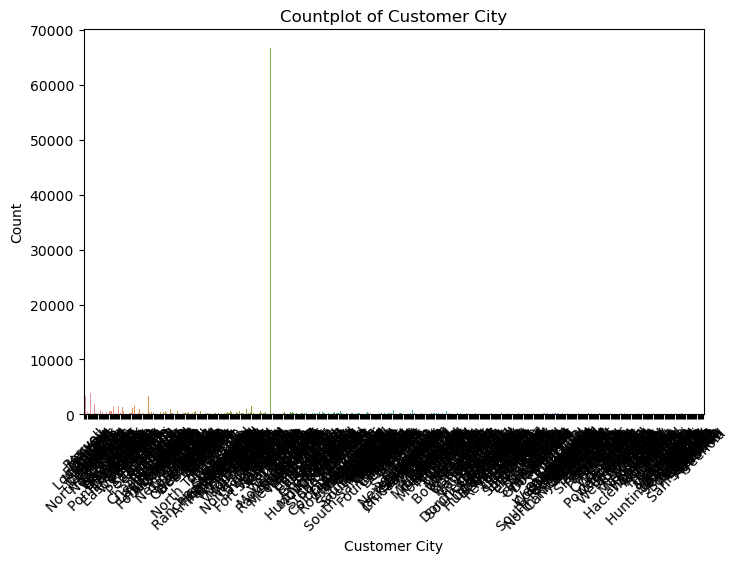

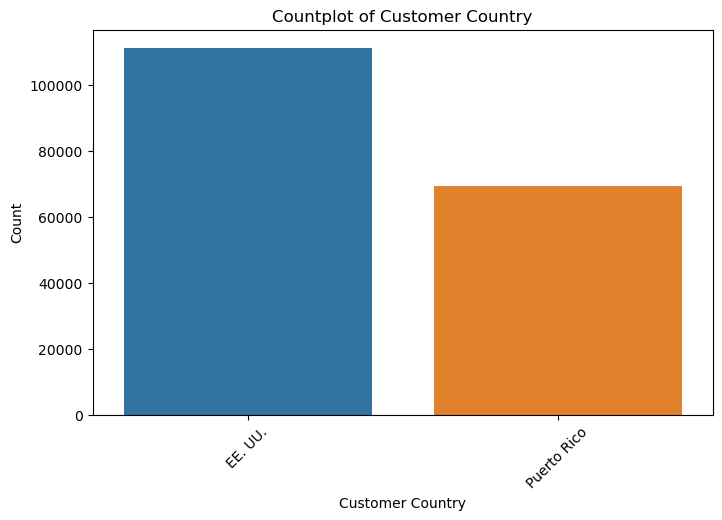

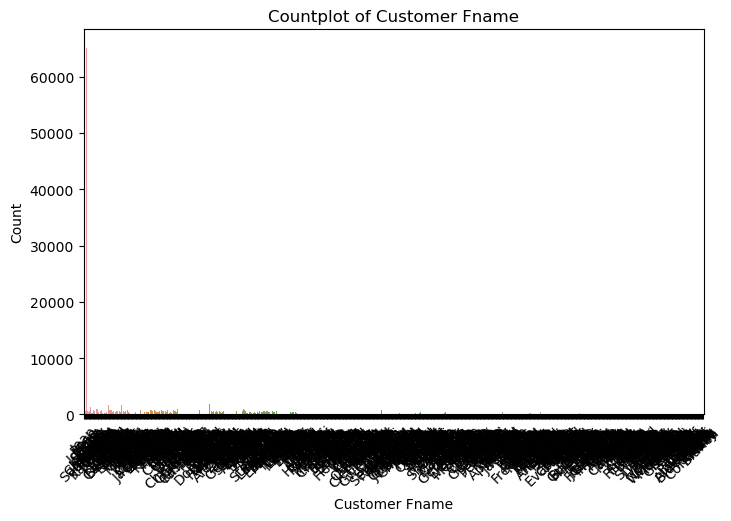

...

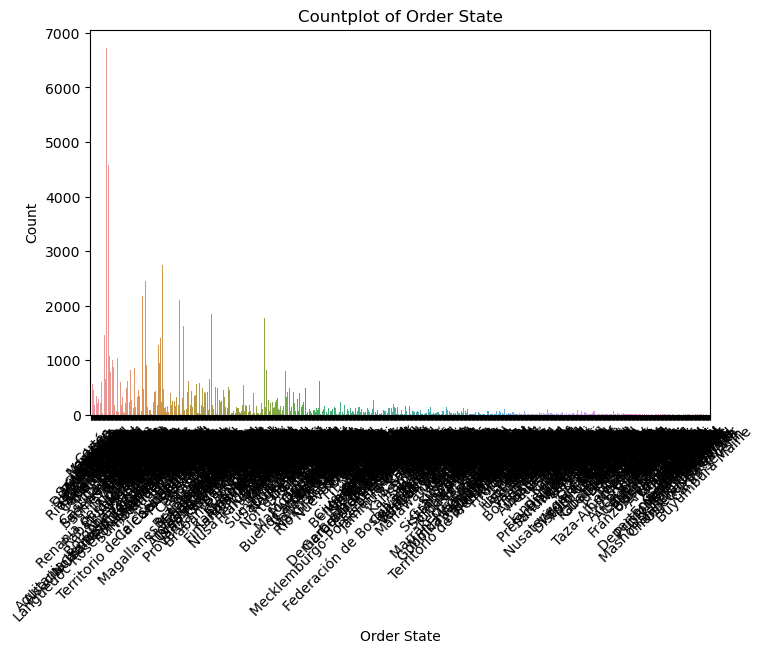

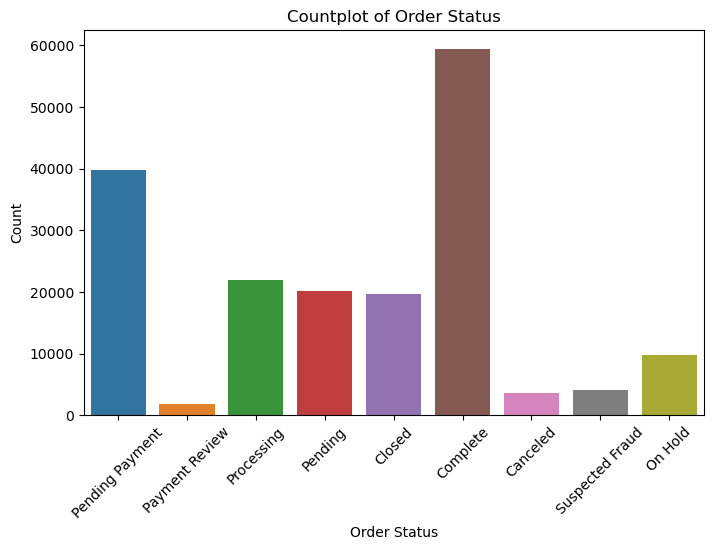

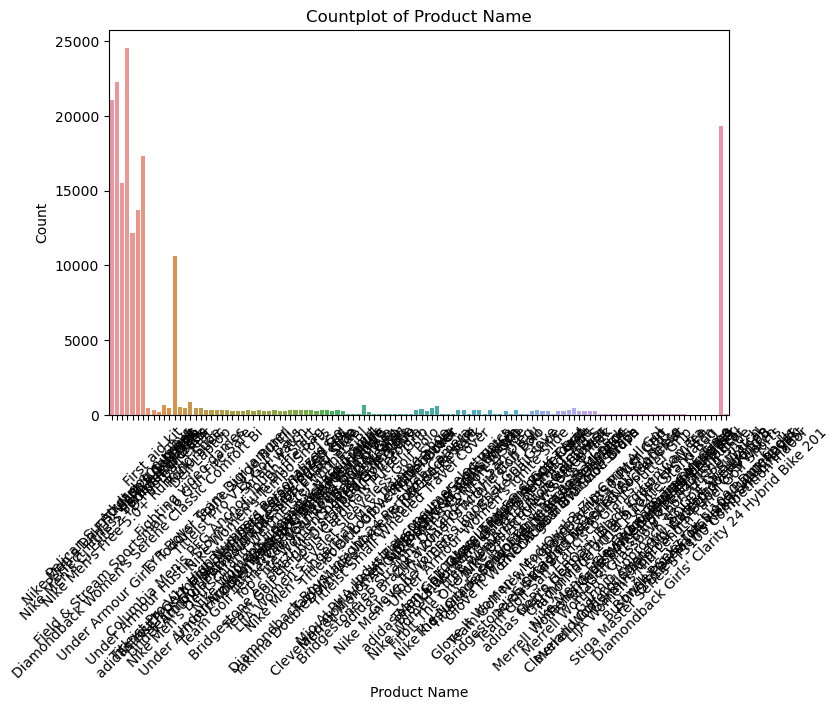

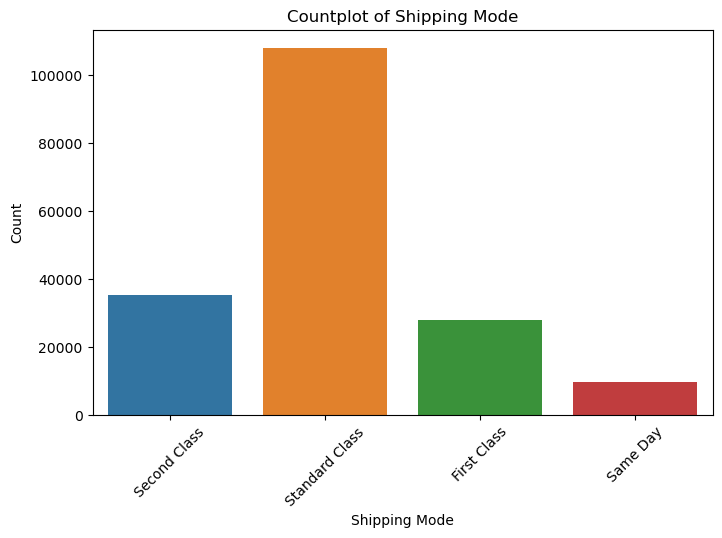

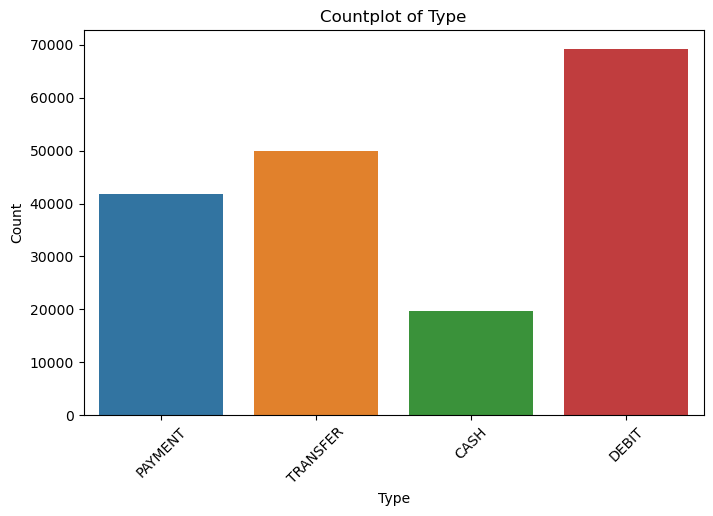

In [41]:
for column in cat.columns:
    plt.figure(figsize=(8, 5))
    sns.countplot(data=sales, x=column)
    plt.title(f'Countplot of {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

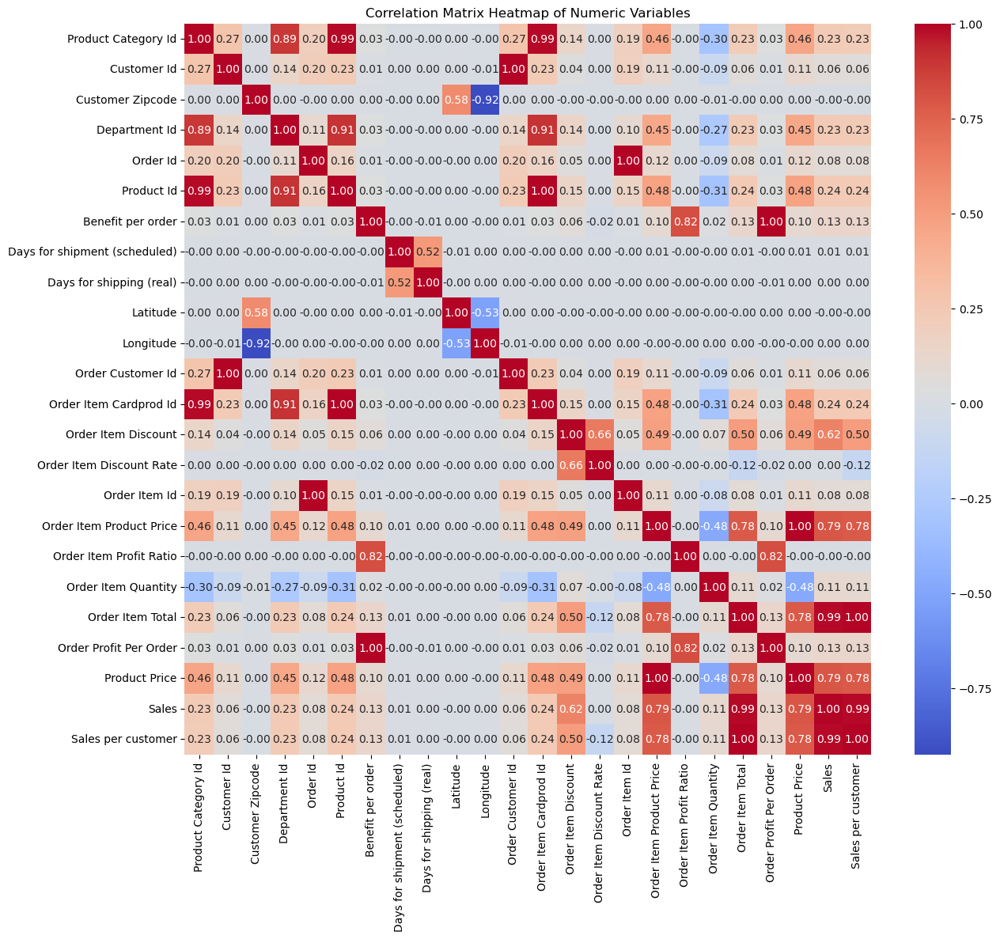

In [507]:
# Bivariate Analysis
#For Numeric- Numeric Data
correlation_matrix = num.corr()
plt.figure(figsize=(14, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix Heatmap of Numeric Variables')
plt.show()

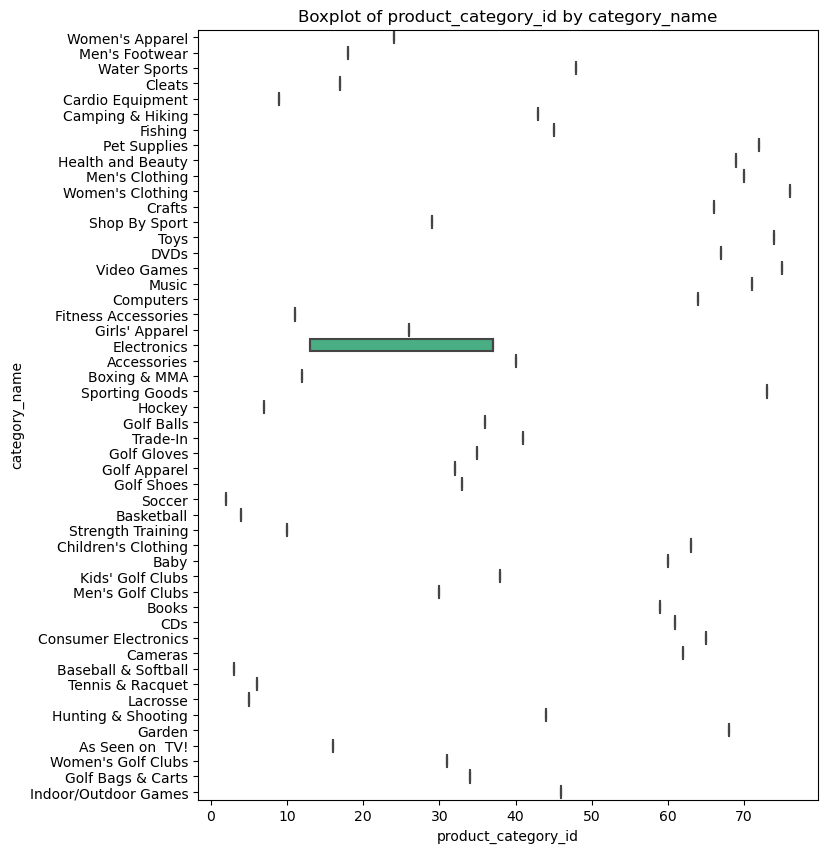

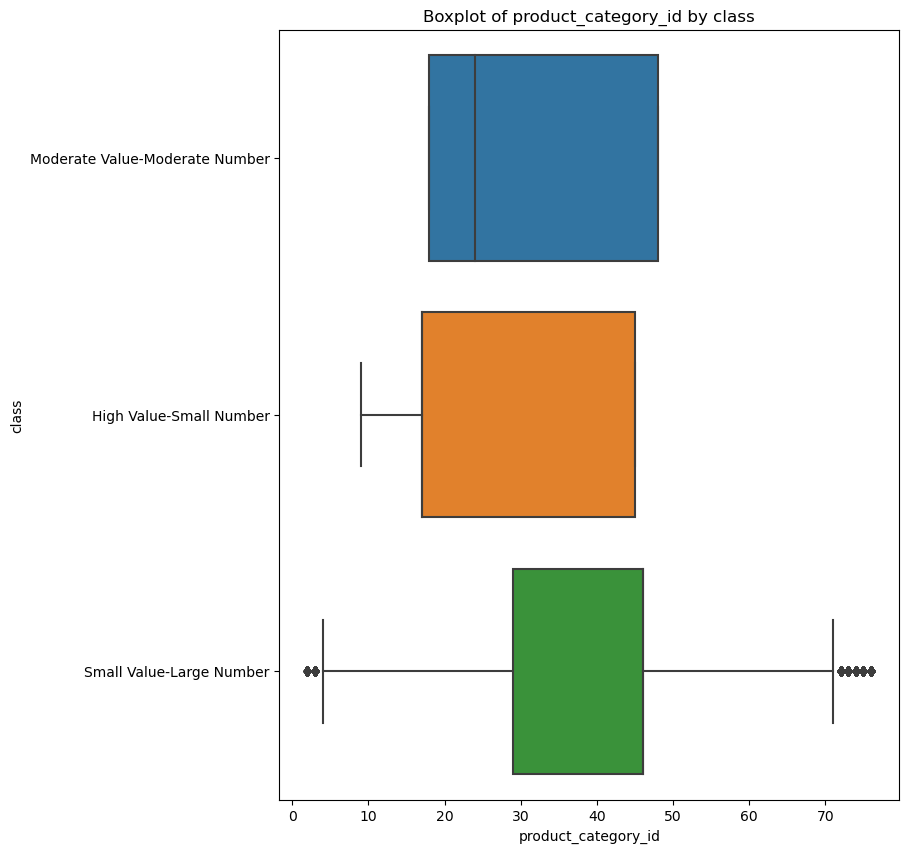

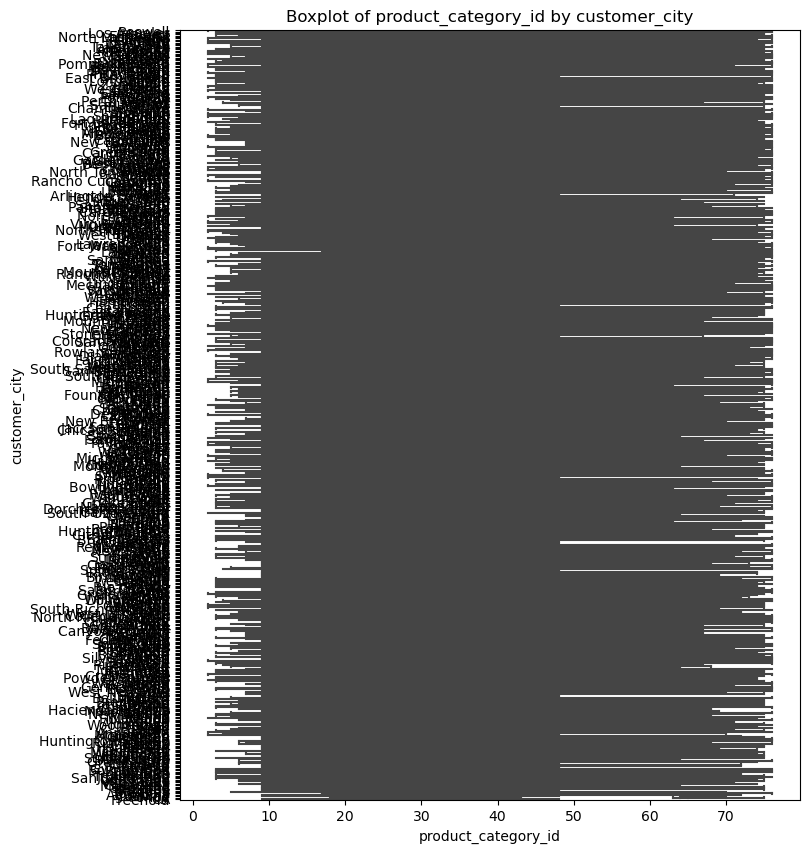

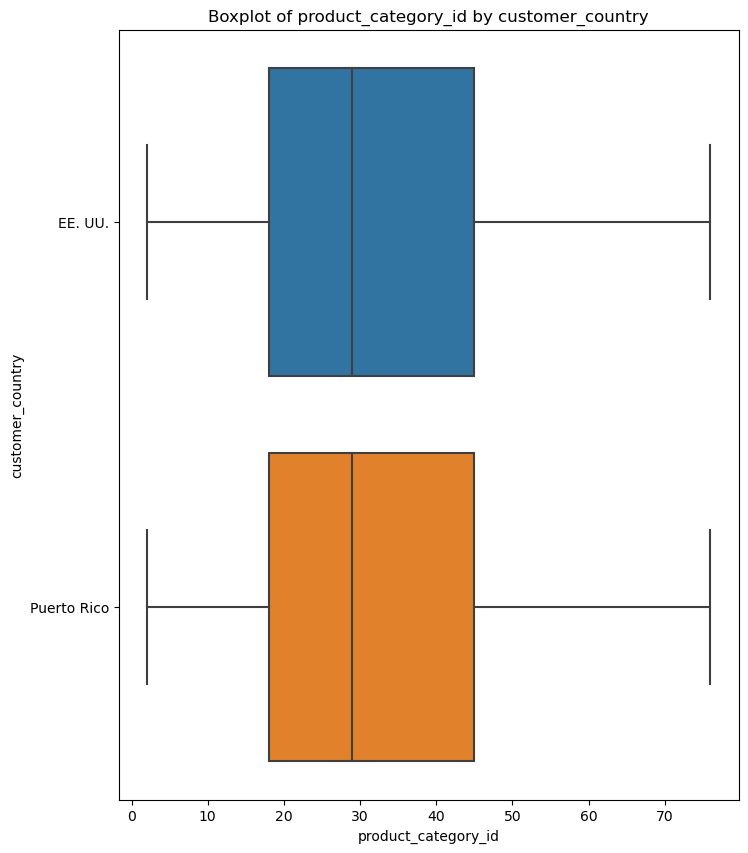

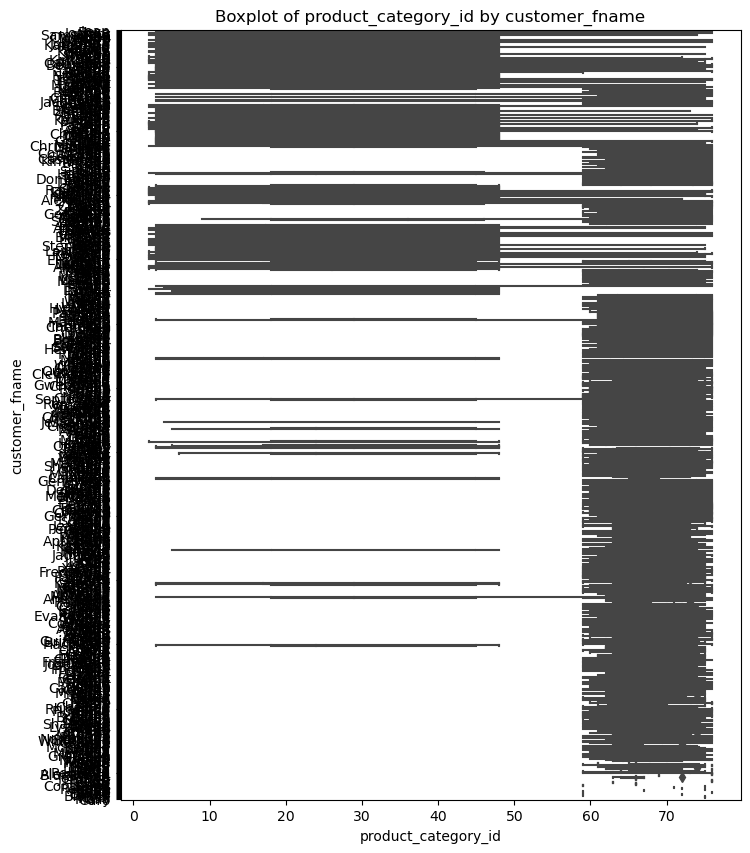

...

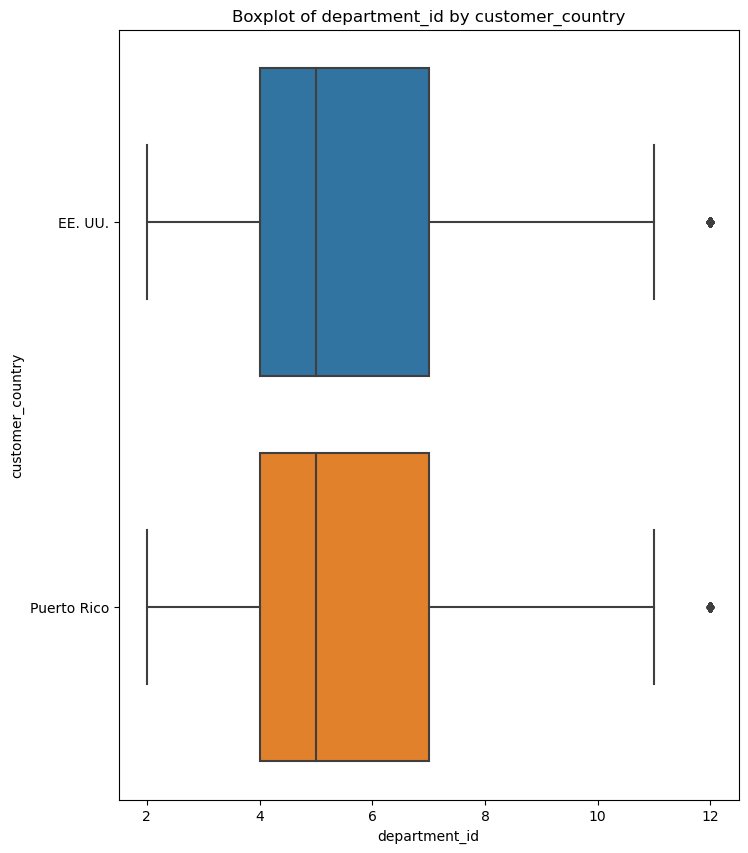

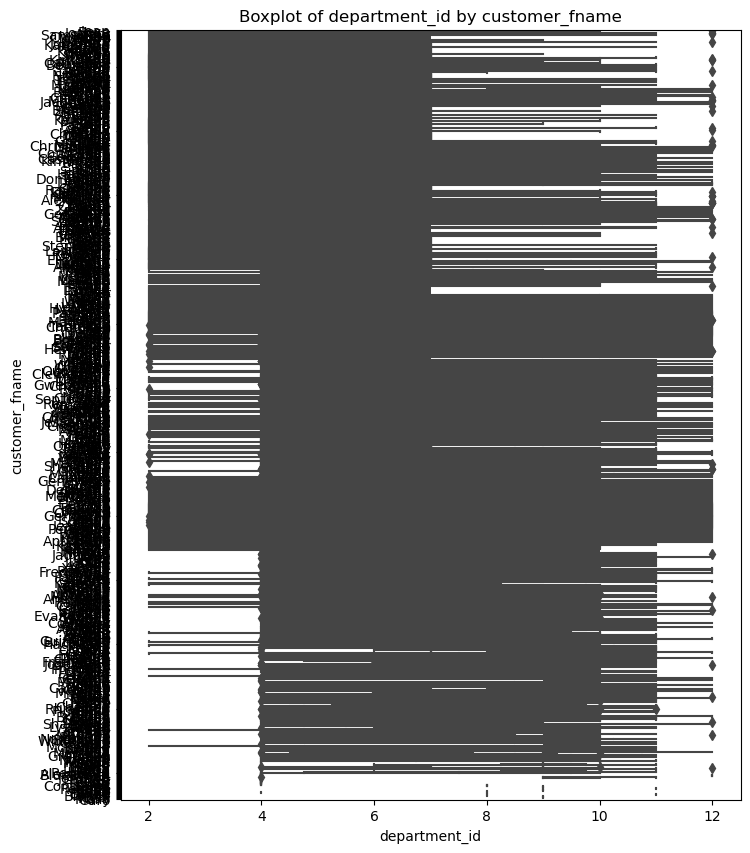

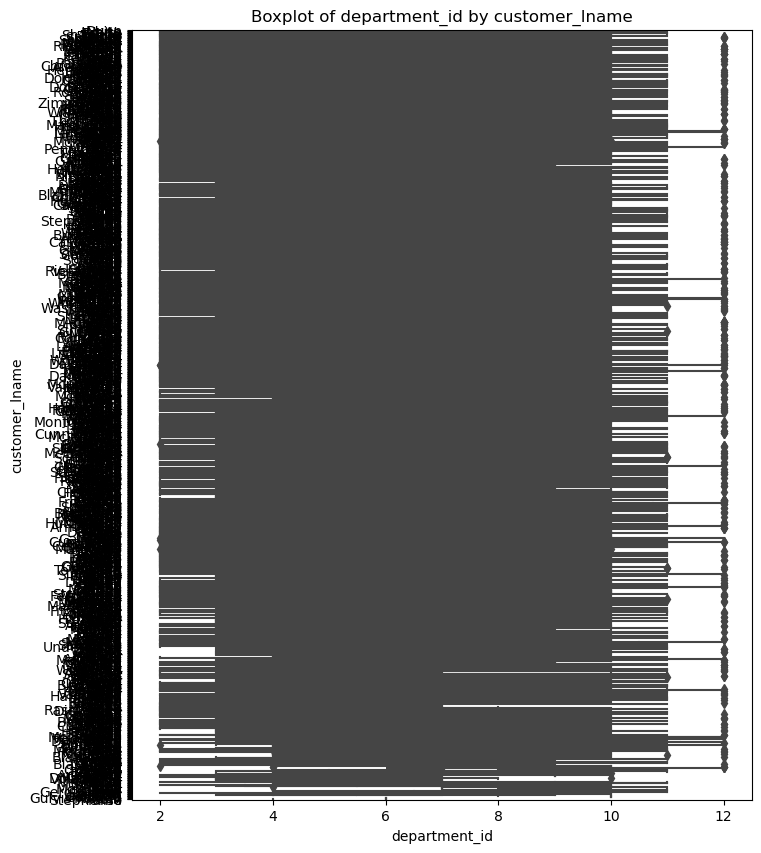

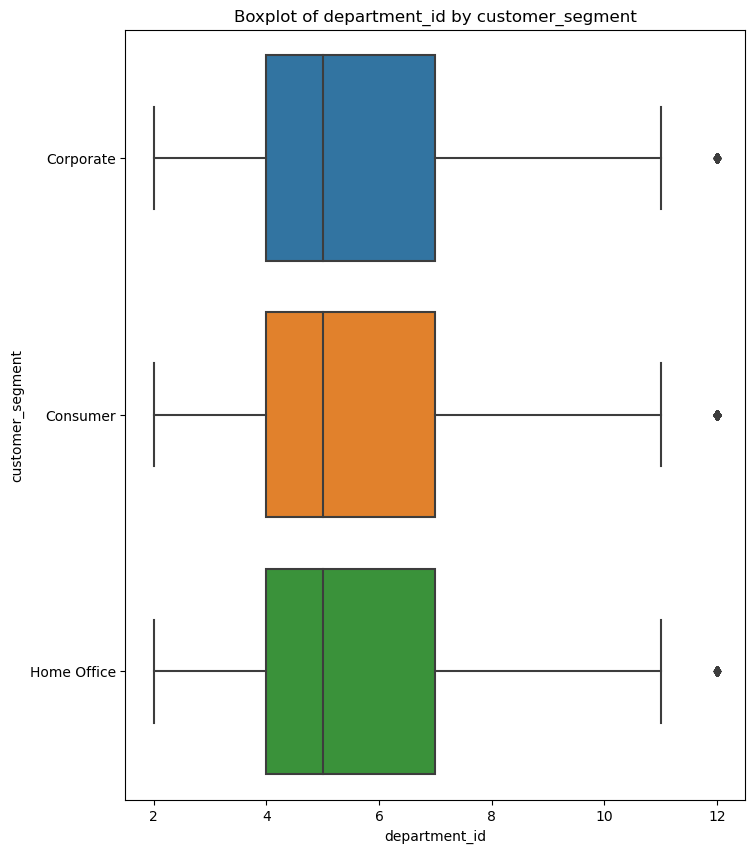

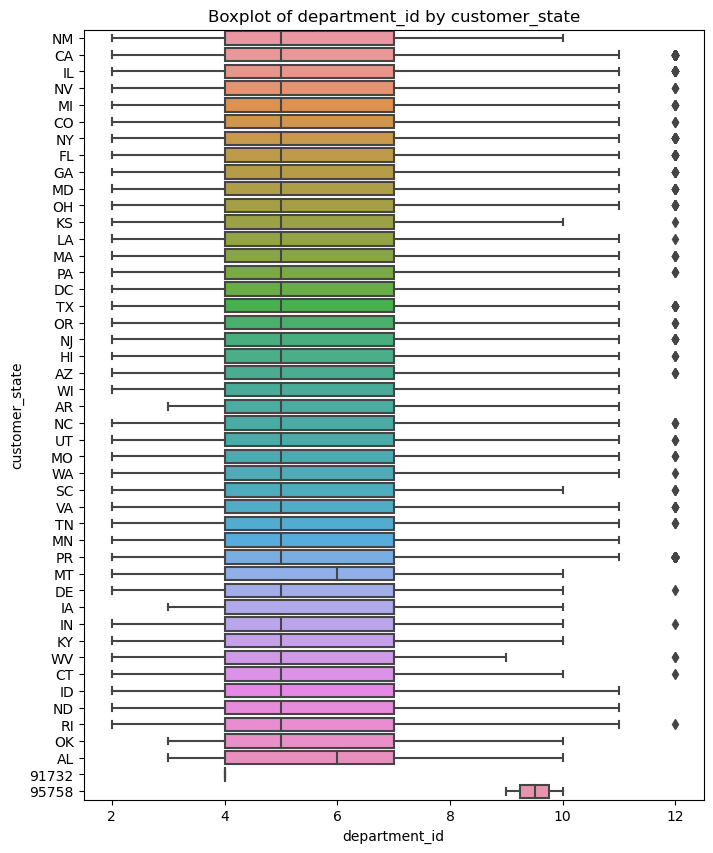

KeyboardInterrupt: 

In [56]:
#For Numeric- Categorical Data
for i in num.columns:
    for j in cat.columns:
        plt.figure(figsize=(8, 10))
        sns.boxplot(data=sales, x=i, y=j)
        plt.title(f'Boxplot of {i} by {j}')
        plt.xlabel(f'{i}')
        plt.ylabel(f'{j}')
        plt.show()


# Finding out data related issues based on the data Audit

In [ ]:
#Zip code is an numerical column but it should be object
#customer state code have some Numbers, 

# Data Preparation:
Creating new flag variable Late Delivery Risk based on Days for shipping (real) & Days for shipment (scheduled) (Flag=Not Late if shipment is not delayed and Flag=Late if shipment is delayed)

In [7]:
sales['Late Delivery Risk '] = sales.apply(lambda row: "Late" if row['Days for shipping (real)'] > row['Days for shipment (scheduled)'] else "Not Late", axis=1)

# 
Renamed the variables as per python naming convensions

In [8]:
new_name = {
    'Product Category Id': 'product_category_id',
    'Category Name': 'category_name',
    'Class': 'class',
    'Customer City': 'customer_city',
    'Customer Country': 'customer_country',
    'Customer Fname': 'customer_fname',
    'Customer Id': 'customer_id',
    'Customer Lname': 'customer_lname',
    'Customer Segment': 'customer_segment',
    'Customer State': 'customer_state',
    'Customer Street': 'customer_street',
    'Customer Zipcode': 'customer_zipcode',
    'Delivery Status': 'delivery_status',
    'Department Id': 'department_id',
    'Department Name': 'department_name',
    'Market': 'market',
    'Order City': 'order_city',
    'Order Country': 'order_country',
    'order date (DateOrders)': 'order_date',
    'Order Id': 'order_id',
    'Order Region': 'order_region',
    'Order State': 'order_state',
    'Order Status': 'order_status',
    'Product Id': 'product_id',
    'Product Name': 'product_name',
    'shipping date (DateOrders)': 'shipping_date',
    'Shipping Mode': 'shipping_mode',
    'Type': 'type',
    'Benefit per order': 'benefit_per_order',
    'Days for shipment (scheduled)': 'days_for_shipment_scheduled',
    'Days for shipping (real)': 'days_for_shipping_real',
    'Latitude': 'latitude',
    'Longitude': 'longitude',
    'Order Customer Id': 'order_customer_id',
    'Order Item Cardprod Id': 'order_item_cardprod_id',
    'Order Item Discount': 'order_item_discount',
    'Order Item Discount Rate': 'order_item_discount_rate',
    'Order Item Id': 'order_item_id',
    'Order Item Product Price': 'order_item_product_price',
    'Order Item Profit Ratio': 'order_item_profit_ratio',
    'Order Item Quantity': 'order_item_quantity',
    'Order Item Total': 'order_item_total',
    'Order Profit Per Order': 'order_profit_per_order',
    'Product Price': 'product_price',
    'Sales': 'sales',
    'Sales per customer': 'sales_per_customer',
    'Late Delivery Risk ': 'late_delivery_risk'
}

In [9]:
sales = sales.rename(columns=new_name)

# 
Converting the variables data types as per the data descriptions

In [10]:
sales['order_date']=pd.to_datetime(sales['order_date'])

In [11]:
sales['shipping_date']=pd.to_datetime(sales['shipping_date'])

# 
Imputed missing values with mean for numerical variables, mode for categorical variables

In [12]:
sales['customer_lname'].fillna(sales['customer_lname'].mode()[0],inplace = True)

In [13]:
sales['customer_zipcode'].fillna(sales['customer_zipcode'].mode()[0],inplace= True)

#  List of Analysis:
 Caclulateing high level metrics like, total sale value, total sale units, inventory value, inventory quantity, profit value, number of distinct products, number of distinct categories, number of distinct products etc

In [14]:
print("Total Sale Value ",round(sales['sales'].sum(),2))

Total Sale Value  36784735.01


In [30]:
print("Total Sale Unit ",round(sales['order_item_total'].sum()))

Total Sale Unit  33054402


In [31]:
q=pd.merge(left=inve,right=sales[['product_id','product_price']],left_on=['product id'],right_on=['product_id'],how='inner')

In [32]:
q['total_inventory_price']=q['current stock']*q['product_price']

In [33]:
print("Total Inventory Value ",q['total_inventory_price'].sum())

Total Inventory Value  2536160997.4468737


In [34]:
print("Inventory Quantity ",inve['current stock'].sum())

Inventory Quantity  18965


In [40]:
print("Profit Value ",round(sales['order_profit_per_order'].sum(),2))

Profit Value  3966902.97


In [36]:
print("Number of Distinct Product ",len(sales['product_id'].unique()))

Number of Distinct Product  118


In [37]:
print("Number of Distinct Category ",len(sales['product_category_id'].unique()))

Number of Distinct Category  51


In [38]:
print("Most orders are from ",sales['customer_state'].mode()[0],"state")

Most orders are from  PR state


In [39]:
print("Most ordered Product Category ",sales['category_name'].mode()[0])

Most ordered Product Category  Cleats


# 
Status of orders (number of orders by current status)

In [30]:
sales['late_delivery_risk'].value_counts()

Late        103400
Not Late     77119
Name: late_delivery_risk, dtype: int64

#
 Status of Delivery of orders (number of orders by each type of delivery status)

In [31]:
sales['delivery_status'].value_counts()

Late        98977
Advance     41592
On time     32196
Canceled     7754
Name: delivery_status, dtype: int64

#
Late Delivery Risk by time (by each week, month, year, quarter)

In [16]:
sales_data = sales

In [17]:
sales_data['week'] = sales_data['order_date'].dt.isocalendar().week
sales_data['month'] = sales_data['order_date'].dt.month_name()
sales_data['year'] = sales_data['order_date'].dt.year
sales_data['quarter'] = sales_data['order_date'].dt.quarter

In [18]:
#Late Delivery Risk by week
sales_data[sales_data['late_delivery_risk'] == 'Late'].groupby(by=['week']).agg(late_delivery_risk=('late_delivery_risk','count'))

,late_delivery_risk
week,
1,1954
2,2281
3,2375
4,2292
5,2235
6,2036
7,2098
8,1992
9,2114


In [19]:
#Late Delivery Risk by Month
q=sales_data[sales_data['late_delivery_risk'] == 'Late'].groupby(by=['month']).agg(late_delivery_risk=('late_delivery_risk','count'))

In [20]:
month_order=['January','February','March','April','May','June','July','August','September','October','November','December']
q=q.loc[month_order]
q

,late_delivery_risk
month,
January,10224
February,8319
March,9167
April,8754
May,9207
June,8638
July,9080
August,9213
September,8931


In [20]:
#Late Delivery Risk by Year
sales_data[sales_data['late_delivery_risk'] == 'Late'].groupby(by=['year']).agg(late_delivery_risk=('late_delivery_risk','count'))

,late_delivery_risk
year,
2015,35877
2016,35841
2017,30436
2018,1246


In [21]:
#Late Delivery Risk by Quarter
sales_data[sales_data['late_delivery_risk'] == 'Late'].groupby(by=['quarter']).agg(late_delivery_risk=('late_delivery_risk','count'))

,late_delivery_risk
quarter,
1,27710
2,26599
3,27224
4,21867


# 
Order Item qty by time (by each week, month, year, quarter)

In [21]:
#Order Item qty by Week 
sales_data.groupby(by=['week']).agg(order_quantity=('order_item_quantity','sum'))

,order_quantity
week,
1,7064
2,8200
3,8672
4,8540
5,8186
6,7812
7,7878
8,8163
9,8089


In [23]:
#Order Item qty by Month 
q=sales_data.groupby(by=['month']).agg(order_quantity=('order_item_quantity','sum'))
q=q.loc[month_order]
q

,order_quantity
month,
January,37179
February,32273
March,35087
April,33684
May,34538
June,32405
July,34543
August,34390
September,33152


In [24]:
#Order Item qty by Quarter 
sales_data.groupby(by=['quarter']).agg(order_quantity=('order_item_quantity','sum'))

,order_quantity
quarter,
1,104539
2,100627
3,102085
4,76828


# 
Sales units/value  by time (by each week, month, year, quarter)

In [25]:
#Sales units/value by Week 
sales_data.groupby(by=['week']).agg(units=('order_item_quantity','sum'),sales_value=('sales',sum))

,units,sales_value
week,,
1,7064,729684.503659
2,8200,789794.354346
3,8672,731081.593856
4,8540,761127.384836
5,8186,769817.035622
6,7812,691626.223329
7,7878,713610.964081
8,8163,721985.423667
9,8089,713596.704159


In [26]:
#Sales units/value by Month
q=sales_data.groupby(by=['month']).agg(units=('order_item_quantity','sum'),sales_value=('sales',sum))
q=q.loc[month_order]
q

,units,sales_value
month,,
January,37179,3.459246e+06
February,32273,2.888088e+06
March,35087,3.125112e+06
April,33684,3.053996e+06
May,34538,3.185364e+06
June,32405,3.059152e+06
July,34543,3.188170e+06
August,34390,3.187032e+06
September,33152,3.164511e+06


In [27]:
#Sales units/value by Year
sales_data.groupby(by=['year']).agg(units=('order_item_quantity','sum'),sales_value=('sales',sum))

,units,sales_value
year,,
2015,138480,1.234083e+07
2016,137352,1.230382e+07
2017,106124,1.180844e+07
2018,2123,3.316501e+05


In [28]:
#Sales units/value by Quarter
sales_data.groupby(by=['quarter']).agg(units=('order_item_quantity','sum'),sales_value=('sales',sum))

,units,sales_value
quarter,,
1,104539,9.472446e+06
2,100627,9.298513e+06
3,102085,9.539713e+06
4,76828,8.474064e+06


# 
Profit orders/value  by time (by each week, month, year, quarter)

In [29]:
#Profit orders/value by Week
sales_data.groupby(by=['week']).agg(sales_value=('sales',sum))

,sales_value
week,
1,729684.503659
2,789794.354346
3,731081.593856
4,761127.384836
5,769817.035622
6,691626.223329
7,713610.964081
8,721985.423667
9,713596.704159


In [30]:
#Profit orders/value by Month
q=sales_data.groupby(by=['month']).agg(sales_value=('sales',sum))
q=q.loc[month_order]
q

,sales_value
month,
January,3.459246e+06
February,2.888088e+06
March,3.125112e+06
April,3.053996e+06
May,3.185364e+06
June,3.059152e+06
July,3.188170e+06
August,3.187032e+06
September,3.164511e+06


In [31]:
#Profit orders/value by Year
sales_data.groupby(by=['year']).agg(sales_value=('sales',sum))

,sales_value
year,
2015,1.234083e+07
2016,1.230382e+07
2017,1.180844e+07
2018,3.316501e+05


In [32]:
#Profit orders/value by Quarter
sales_data.groupby(by=['quarter']).agg(sales_value=('sales',sum))

,sales_value
quarter,
1,9.472446e+06
2,9.298513e+06
3,9.539713e+06
4,8.474064e+06


# 
Order profit per order  by time (by each week, month, year, quarter)

In [33]:
#Order profit per order by Week 
sales_data.groupby(by=['week']).agg(order_profit_per_order=('order_profit_per_order',sum))

,order_profit_per_order
week,
1,92037.640254
2,75680.460163
3,74293.699870
4,72440.370232
5,84926.320370
6,83214.700180
7,61892.830302
8,76089.980144
9,82736.900161


In [34]:
#Order profit per order by Month 
q=sales_data.groupby(by=['month']).agg(order_profit_per_order=('order_profit_per_order',sum))
q=q.loc[month_order]
q

,order_profit_per_order
month,
January,367127.430615
February,301061.220935
March,333727.100652
April,339021.360056
May,337878.660269
June,324742.520726
July,348592.480100
August,360210.470630
September,359315.040248


In [35]:
#Order profit per order by Year 
sales_data.groupby(by=['year']).agg(order_profit_per_order=('order_profit_per_order',sum))

,order_profit_per_order
year,
2015,1.318857e+06
2016,1.310119e+06
2017,1.304085e+06
2018,3.384189e+04


In [36]:
#Order profit per order by Quarter 
sales_data.groupby(by=['quarter']).agg(order_profit_per_order=('order_profit_per_order',sum))

,order_profit_per_order
quarter,
1,1.001916e+06
2,1.001643e+06
3,1.068118e+06
4,8.952267e+05


# 
Order count by country/state/  by time (by each week, month, year, quarter)

In [37]:
#Order count by country by Week
sales_data.groupby(by=['week','customer_country','customer_state']).agg(order_count=('order_profit_per_order','count')).reset_index()

,week,customer_country,customer_state,order_count
0,1,EE. UU.,AL,4
1,1,EE. UU.,AR,2
2,1,EE. UU.,AZ,71
3,1,EE. UU.,CA,527
4,1,EE. UU.,CO,56
...,...,...,...,...
2145,53,EE. UU.,VA,13
2146,53,EE. UU.,WA,4
2147,53,EE. UU.,WI,4
2148,53,EE. UU.,WV,3


In [38]:
#Order count by country by Month
q=sales_data.groupby(by=['month','customer_country','customer_state']).agg(order_count=('order_profit_per_order','count')).reset_index()
q=q.set_index('month')
q=q.loc[month_order]
q

,customer_country,customer_state,order_count
month,,,
January,EE. UU.,AL,4
January,EE. UU.,AR,28
January,EE. UU.,AZ,350
January,EE. UU.,CA,2914
January,EE. UU.,CO,232
...,...,...,...
December,EE. UU.,VA,151
December,EE. UU.,WA,79
December,EE. UU.,WI,54


In [39]:
#Order count by country by Year
sales_data.groupby(by=['year','customer_country','customer_state']).agg(order_count=('order_profit_per_order','count')).reset_index()

,year,customer_country,customer_state,order_count
0,2015,EE. UU.,AL,2
1,2015,EE. UU.,AR,61
2,2015,EE. UU.,AZ,1044
3,2015,EE. UU.,CA,10209
4,2015,EE. UU.,CO,688
...,...,...,...,...
172,2018,EE. UU.,VA,24
173,2018,EE. UU.,WA,10
174,2018,EE. UU.,WI,5
175,2018,EE. UU.,WV,2


In [40]:
#Order count by country/state/ by Quarter
sales_data.groupby(by=['quarter','customer_country','customer_state']).agg(order_count=('order_profit_per_order','count')).reset_index()

,quarter,customer_country,customer_state,order_count
0,1,EE. UU.,AL,4
1,1,EE. UU.,AR,69
2,1,EE. UU.,AZ,845
3,1,EE. UU.,CA,8032
4,1,EE. UU.,CO,503
...,...,...,...,...
173,4,EE. UU.,VA,427
174,4,EE. UU.,WA,218
175,4,EE. UU.,WI,184
176,4,EE. UU.,WV,68


# 
Inventory Units by each class or cluster

In [41]:
x=pd.merge(left=sales[['product_id','class']],right=inve,left_on=['product_id'],right_on=['product id'],how='inner')

In [42]:
x.groupby(by=['class']).agg(inventory_units_count=('current stock',sum)).reset_index()

,class,inventory_units_count
0,High Value-Small Number,13399842
1,Moderate Value-Moderate Number,6059123
2,Small Value-Large Number,10919162


# 
Inventory Value by each class or cluster

In [43]:
x=pd.merge(left=sales[['product_id','class','order_item_product_price']],right=inve,left_on=['product_id'],right_on=['product id'],how='inner')

In [44]:
x['inventory_value']=x['order_item_product_price']*x['current stock']

In [45]:
x.groupby(by=['class']).agg(inventory_value=('inventory_value',sum)).reset_index()

,class,inventory_value
0,High Value-Small Number,1.387021e+09
1,Moderate Value-Moderate Number,5.615272e+08
2,Small Value-Large Number,5.876127e+08


# 
Inventory by class

In [46]:
x=pd.merge(left=sales[['product_id','class']],right=inve,left_on=['product_id'],right_on=['product id'],how='inner')

x.groupby(by=['class']).agg(inventory_count=('current stock',sum)).reset_index()

,class,inventory_count
0,High Value-Small Number,13399842
1,Moderate Value-Moderate Number,6059123
2,Small Value-Large Number,10919162


# 
 Detail Stock Action (products to be ordered, not required to ordered)

In [512]:
inve['stock_action']= inve['order-now'].apply(lambda x: 'not required to order' if x == 'green' else 'product to be ordered')

In [513]:
inve.head()

,order-now,product id,product name,avg lead time,avg order qty,current stock,max lead time,max order qty,mod,reorder point,safety stock,stock_action
0,green,19,Nike Men's Fingertrap Max Training Shoe,10,1,69,30,1,1,35,25,not required to order
1,orange,24,Elevation Training Mask 2.0,10,3,175,30,5,0,175,144,product to be ordered
2,green,35,adidas Brazuca 2014 Official Match Ball,10,1,65,30,1,1,35,25,not required to order
3,green,37,adidas Kids' F5 Messi FG Soccer Cleat,10,3,328,30,5,1,175,146,not required to order
4,orange,44,adidas Men's F10 Messi TRX FG Soccer Cleat,10,3,175,30,5,0,175,145,product to be ordered


# 
Product Order qty trend  (by time (by each week, month, year, quarter))

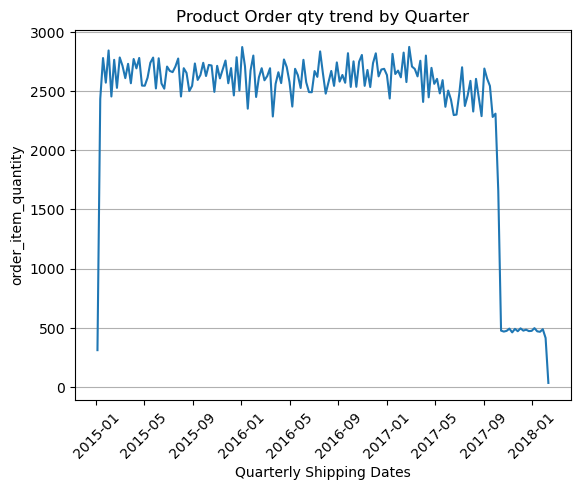

In [48]:
#Product Order qty trend by Week
q=sales.resample('W',on='shipping_date')['order_item_quantity'].sum().reset_index()
plt.grid(axis='y', linestyle='-')

sns.lineplot(x=q.shipping_date,y=q.order_item_quantity)
plt.xticks(rotation =45)
plt.xlabel("Quarterly Shipping Dates")
plt.title("Product Order qty trend by Quarter")
plt.show()

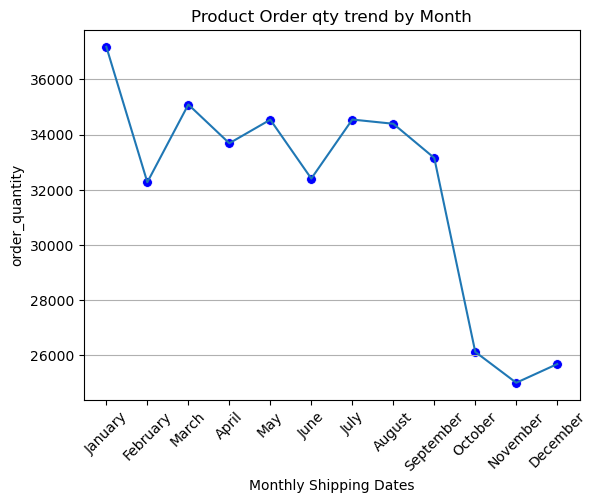

In [49]:
#Product Order qty trend by Month
q=sales_data.groupby(by=['month']).agg(order_quantity=('order_item_quantity',sum))
q=q.loc[month_order]
sns.lineplot(data=q, x='month', y='order_quantity')
sns.scatterplot(data=q, x='month', y='order_quantity', color='blue', s=50)
plt.grid(axis='y', linestyle='-')
plt.xticks(rotation=45)
plt.xlabel("Monthly Shipping Dates")
plt.title("Product Order qty trend by Month")
plt.show()

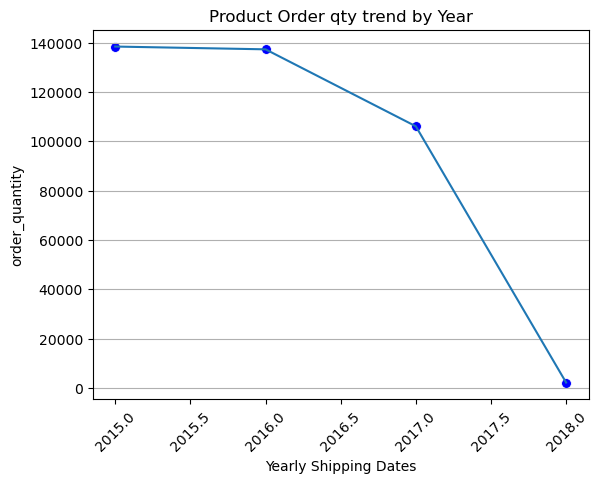

In [50]:
#Product Order qty trend by Quarter
q=sales_data.groupby(by=['year']).agg(order_quantity=('order_item_quantity',sum))
sns.lineplot(data=q, x='year', y='order_quantity')
sns.scatterplot(data=q, x='year', y='order_quantity', color='blue', s=50)
plt.grid(axis='y', linestyle='-')
plt.xticks(rotation=45)
plt.xlabel("Yearly Shipping Dates")
plt.title("Product Order qty trend by Year")
plt.show()

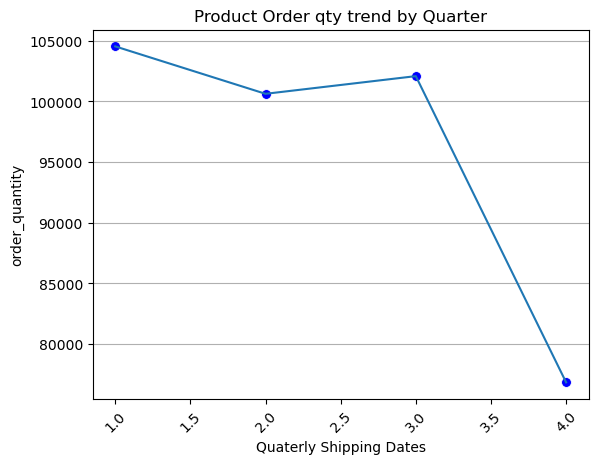

In [51]:
#Product Order qty trend by Quarter
q=sales_data.groupby(by=['quarter']).agg(order_quantity=('order_item_quantity',sum))
sns.lineplot(data=q, x='quarter', y='order_quantity')
sns.scatterplot(data=q, x='quarter', y='order_quantity', color='blue', s=50)
plt.grid(axis='y', linestyle='-')
plt.xticks(rotation=45)
plt.xlabel("Quaterly Shipping Dates")
plt.title("Product Order qty trend by Quarter")
plt.show()

# 
Top 10 Most ordered products/Top 10 Most Categories/Top 10 cities interms of revenue and sale units (quantity)

In [52]:
q15=pd.merge(left=sales,right=inve,left_on='product_id',right_on='product id',how='inner')

In [53]:
q15.groupby(by=['product name','category_name']).agg(Revenue=('sales',sum)).sort_values(by='Revenue',ascending=False).head(10).reset_index()


,product name,category_name,Revenue
0,Field & Stream Sportsman 16 Gun Fire Safe,Fishing,6.929654e+06
1,Perfect Fitness Perfect Rip Deck,Cleats,4.421143e+06
2,Diamondback Women's Serene Classic Comfort Bi,Camping & Hiking,4.118426e+06
3,Nike Men's Free 5.0+ Running Shoe,Cardio Equipment,3.667633e+06
4,Nike Men's Dri-FIT Victory Golf Polo,Women's Apparel,3.147800e+06
5,Pelican Sunstream 100 Kayak,Water Sports,3.099845e+06
6,Nike Men's CJ Elite 2 TD Football Cleat,Men's Footwear,2.891758e+06
7,O'Brien Men's Neoprene Life Vest,Indoor/Outdoor Games,2.888994e+06
8,Under Armour Girls' Toddler Spine Surge Runni,Shop By Sport,1.269083e+06
9,Dell Laptop,Computers,6.630000e+05


In [80]:
#Top 10 Cities in terms of revenue
q15.groupby(by='customer_city').agg(Revenue=('sales',sum)).sort_values(by='Revenue',ascending=False).head(10).reset_index()

,customer_city,Revenue
0,Caguas,1.361027e+07
1,Chicago,7.976142e+05
2,Los Angeles,6.978874e+05
3,Brooklyn,6.764198e+05
4,New York,3.612171e+05
5,Philadelphia,3.157055e+05
6,Bronx,3.089050e+05
7,San Diego,2.938305e+05
8,Miami,2.703682e+05
9,Houston,2.673479e+05


In [81]:
#Top 10 Most ordered Products in terms of Order Quantity
q15.groupby(by='product name').agg(Quantity_ordered=('order_item_quantity',sum)).sort_values(by='Quantity_ordered',ascending=False).head(10).reset_index()

,product name,Quantity_ordered
0,Perfect Fitness Perfect Rip Deck,73698
1,Nike Men's Dri-FIT Victory Golf Polo,62956
2,O'Brien Men's Neoprene Life Vest,57803
3,Nike Men's Free 5.0+ Running Shoe,36680
4,Under Armour Girls' Toddler Spine Surge Runni,31735
5,Nike Men's CJ Elite 2 TD Football Cleat,22246
6,Field & Stream Sportsman 16 Gun Fire Safe,17325
7,Pelican Sunstream 100 Kayak,15500
8,Diamondback Women's Serene Classic Comfort Bi,13729
9,ENO Atlas Hammock Straps,998


In [82]:
#Top 10 Most ordered Categories in terms of Order Quantity
q15.groupby(by='category_name').agg(Quantity_ordered=('order_item_quantity',sum)).sort_values(by='Quantity_ordered',ascending=False).head(10).reset_index()

,category_name,Quantity_ordered
0,Cleats,73734
1,Women's Apparel,62956
2,Indoor/Outdoor Games,57803
3,Cardio Equipment,37587
4,Shop By Sport,32726
5,Men's Footwear,22246
6,Fishing,17325
7,Water Sports,15540
8,Camping & Hiking,13729
9,Electronics,9436


In [83]:
#Top 10 City in terms of Order Quantity
q15.groupby(by='customer_city').agg(Quantity_ordered=('order_item_quantity',sum)).sort_values(by='Quantity_ordered',ascending=False).head(10).reset_index()

,customer_city,Quantity_ordered
0,Caguas,142319
1,Chicago,8226
2,Los Angeles,7252
3,Brooklyn,7251
4,New York,3862
5,Philadelphia,3399
6,Bronx,3204
7,San Diego,3084
8,Houston,2787
9,Miami,2751


# 
Top payment methods by each product category.

In [84]:
sales.groupby(['category_name', 'type']).size().reset_index(name='count').sort_values(by=['count'],ascending=False).head(10)

,category_name,type,count
49,Cleats,DEBIT,9450
137,Men's Footwear,DEBIT,8589
189,Women's Apparel,DEBIT,8199
121,Indoor/Outdoor Games,DEBIT,7436
51,Cleats,TRANSFER,6827
73,Fishing,DEBIT,6588
139,Men's Footwear,TRANSFER,6150
185,Water Sports,DEBIT,5835
191,Women's Apparel,TRANSFER,5693
50,Cleats,PAYMENT,5675


# 
shipping mode which is more efficient interms of not delaying?

In [523]:
sales['delay']=sales['days_for_shipping_real']-sales['days_for_shipment_scheduled']

In [526]:
#Less Delay means more efficient
#Therfore Standard Class is most efficient
sales.groupby(by=['shipping_mode']).agg(delays=('delay',sum))

,delays
shipping_mode,
First Class,27814
Same Day,4657
Second Class,70109
Standard Class,-441


# 
 Number of orders, sales, qty  by order status

In [87]:
sales.groupby('order_status').agg(orders=('order_id', 'count'),total_sales=('sales', 'sum'),total_quantity=('order_item_quantity', 'sum')).reset_index()

,order_status,orders,total_sales,total_quantity
0,Canceled,3692,7.443704e+05,7875
1,Closed,19616,4.022624e+06,41458
2,Complete,59491,1.209531e+07,126624
3,On Hold,9804,1.981543e+06,20845
4,Payment Review,1893,3.836537e+05,4109
5,Pending,20227,4.120533e+06,43196
6,Pending Payment,39832,8.106698e+06,84736
7,Processing,21902,4.504064e+06,46623
8,Suspected Fraud,4062,8.259350e+05,8613


## 
categories which are most profitable categories (top5)?

In [530]:
sales.groupby(by=['category_name']).agg(Profit=('order_profit_per_order',sum)).reset_index().head(5)

,category_name,Profit
0,Accessories,16643.520074
1,As Seen on TV!,714.429980
2,Baby,1525.029992
3,Baseball & Softball,12762.130067
4,Basketball,1845.670003


## 
 categoires which have been given highest average discount (top5)?

In [88]:
sales.groupby(by=['category_name']).agg(Avg_Discount=('order_item_discount','mean')).sort_values(by=['Avg_Discount'],ascending=False).head(5)

,Avg_Discount
category_name,
Computers,152.952489
Strength Training,54.790270
Garden,53.726280
Crafts,46.800517
Cameras,45.795609


## 
All other analysis

In [89]:
#1--List of Products for which .Urgent Stocks are needed
inve.loc[inve['current stock']<=35][['product id','product name']]

,product id,product name
5,58,Diamondback Boys' Insight 24 Performance Hybr
6,60,SOLE E25 Elliptical
17,208,SOLE E35 Elliptical
18,216,Yakima DoubleDown Ace Hitch Mount 4-Bike Rack
19,226,Bowflex SelectTech 1090 Dumbbells
34,364,Total Gym 1400
48,652,Merrell Women's Grassbow Sport Waterproof Hik
49,666,Merrell Men's All Out Flash Trail Running Sho
61,768,Titleist Club Glove Travel Cover
67,786,TaylorMade 2014 Purelite Stand Bag


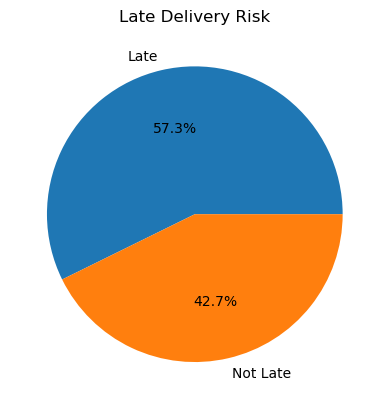

In [90]:
#2--More than half deliveries are late
sales['late_delivery_risk'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Late Delivery Risk')
plt.ylabel("")
plt.show()

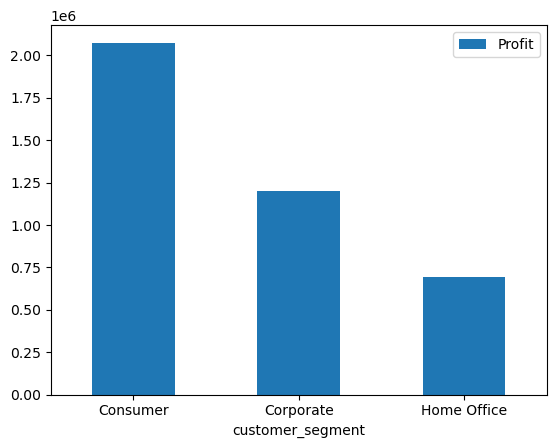

In [531]:
#3--Consumer Segment gives the most Profit
sales.groupby(by=['customer_segment']).agg(Profit=('order_profit_per_order',sum)).plot(kind='bar')
plt.xticks(rotation=0)
plt.show()

In [92]:
#4--
v=0
for i in range(len(sales)):
    if(sales['days_for_shipment_scheduled'][i]<sales['days_for_shipping_real'][i]):
        v+=1
v=(v/len(sales))*100
v 
print(round(v),"% times the shippment is late")

57 % times the shippment is late


In [93]:
#5-Shipping mode preferences of Customer
sales['shipping_mode'].value_counts()

Standard Class    107752
Second Class       35216
First Class        27814
Same Day            9737
Name: shipping_mode, dtype: int64

In [94]:
#6-- Order status of customers by Shipping mode
# Standar class have complete more than First Class orders.
pd.crosstab(sales['shipping_mode'],sales['order_status'])

order_status,Canceled,Closed,Complete,On Hold,Payment Review,Pending,Pending Payment,Processing,Suspected Fraud
shipping_mode,,,,,,,,,
First Class,615,3017,9307,1455,315,3140,5907,3372,686
Same Day,225,1124,3164,522,94,1125,2095,1169,219
Second Class,661,3804,11655,1815,386,3886,8017,4243,749
Standard Class,2191,11671,35365,6012,1098,12076,23813,13118,2408


In [23]:
#7--
cuastomer_purchases = sales.groupby('customer_id')['order_id'].nunique()
repeated_customers_count = sum(customer_purchases > 1)
total_customers = len(customer_purchases)
repeated_customers_percentage = round((repeated_customers_count / total_customers) * 100,2)
print("Percentage of repeated customers " ,repeated_customers_percentage,"%")

Percentage of repeated customers  56.98 %


## Created visualizations of the analysis  

In [95]:
v1=sales['order_status'].value_counts().reset_index()

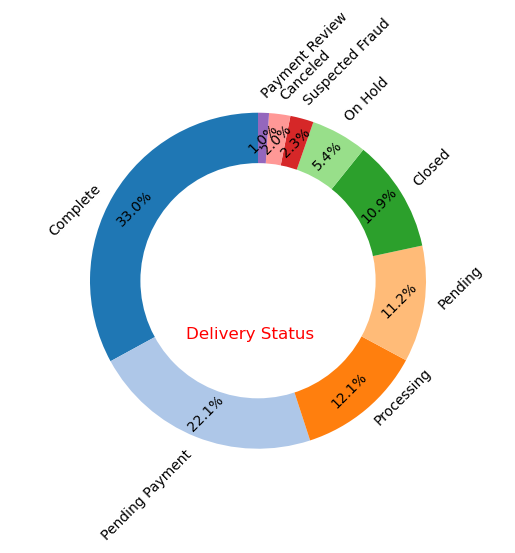

In [179]:
fig, ax = plt.subplots()
ax.pie(v1['order_status'], labels=v1['index'], autopct='%1.1f%%',  startangle=90, colors=plt.cm.tab20.colors,
        wedgeprops=dict(width=0.4), textprops=dict(fontsize=10, rotation_mode='anchor', rotation=45),
        pctdistance=0.85)
centre_circle = plt.Circle((0, 0), 0.7, fc='white')

fig = plt.gcf()
fig.gca().add_artist(centre_circle)
ax.axis('equal')
plt.suptitle('Delivery Status', color='red', y=0.4,x=0.5)

plt.show()
#rotated because labels were overlapping

In [133]:
def large_number(number):
    if number >= 1e6:  
        return f'{number / 1e6:.0f}M'
    elif number >= 1e3:  
        return f'{number / 1e3:.0f}k'
    else:
        return str(number)

In [134]:
total_inventory_units=inve['current stock'].sum()

In [135]:
total_inventory_units=large_number(total_inventory_units)

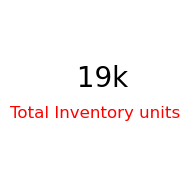

In [136]:
plt.figure(figsize=(2, 2))
plt.text(0.5, 0.5, f' {total_inventory_units}', ha='center', fontsize=20)
plt.axis('off') 
plt.suptitle('Total Inventory units', color='red', y=0.4,x=0.5)
plt.show()

In [104]:
d=pd.merge(left=sales[['product_id','order_item_product_price']],right=inve,left_on=['product_id'],right_on=['product id'],how='inner')

In [106]:
d['inve_value']=d['order_item_product_price']*d['current stock']

In [110]:
total_inventory_value=round(d['inve_value'].sum(),2)

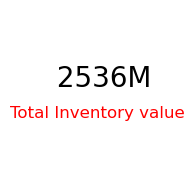

In [137]:
total_inventory_value=large_number(total_inventory_value)
plt.figure(figsize=(2, 2))
plt.text(0.5, 0.5, f' {total_inventory_value}', ha='center', fontsize=20)
plt.axis('off') 
plt.suptitle('Total Inventory value', color='red', y=0.4,x=0.5)
plt.show()

In [138]:
sales_unit=sales['order_item_quantity'].sum()
sales_unit=large_number(sales_unit)

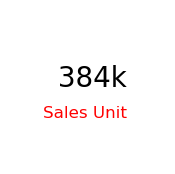

In [142]:
plt.figure(figsize=(2, 2))
plt.text(0.5, 0.5, f' {sales_unit}', ha='center', fontsize=20)
plt.axis('off') 
plt.suptitle('Sales Unit', color='red', y=0.4,x=0.5)
plt.show()

In [146]:
profit_value=round(sales['sales'].sum(),2)
profit_value=large_number(profit_value)

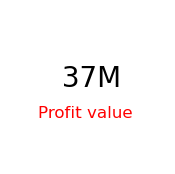

In [149]:
plt.figure(figsize=(2, 2))
plt.text(0.5, 0.5, f' {profit_value}', ha='center', fontsize=20)
plt.axis('off') 
plt.suptitle('Profit value', color='red', y=0.4,x=0.5)
plt.show()

In [151]:
p=sales['order_status'].value_counts()

In [156]:
p=p.reset_index()

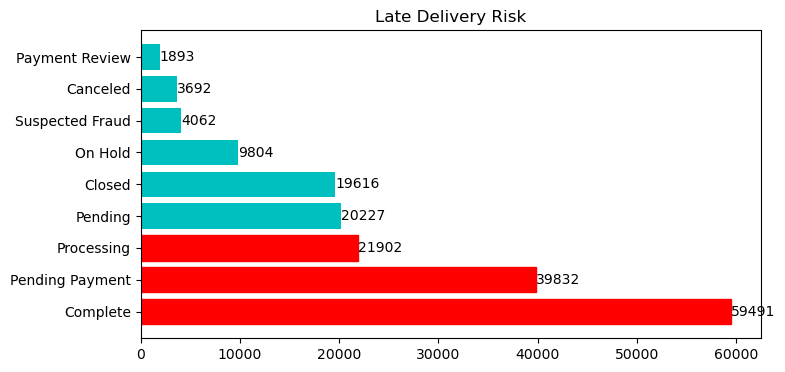

In [180]:
plt.figure(figsize=(8,4))
bars=plt.barh(p['index'],p['order_status'],color='c')
for bar, value in zip(bars, p['order_status']):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, str(value), ha='left', va='center')
top_indices = p['order_status'].argsort()[-3:][::-1]
for index in top_indices:
    bars[index].set_color('red')
plt.title("Late Delivery Risk")
plt.show()

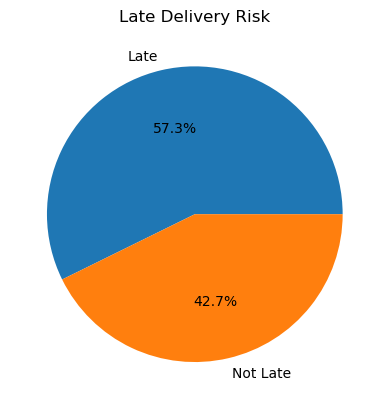

In [181]:
sales['late_delivery_risk'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Late Delivery Risk')
plt.ylabel("")
plt.show()

In [191]:
c=sales['late_delivery_risk'].value_counts().reset_index()

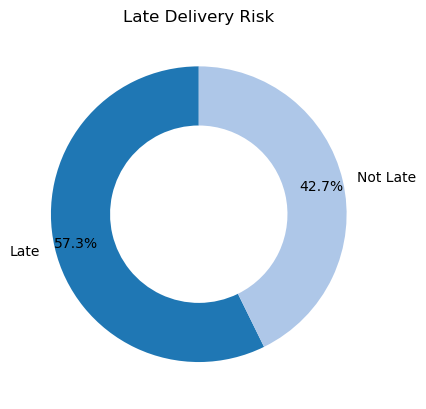

In [190]:

fig, ax = plt.subplots()
ax.pie(c['late_delivery_risk'], labels=c['index'], autopct='%1.1f%%',  startangle=90, colors=plt.cm.tab20.colors,
        wedgeprops=dict(width=0.4), textprops=dict(fontsize=10),
        pctdistance=0.85)
centre_circle = plt.Circle((0, 0), 0.7, fc='white')
plt.title("Late Delivery Risk")
plt.show()

In [217]:
b=sales.groupby(by=['year']).agg(Order_quantity=('order_item_quantity',sum)).reset_index()

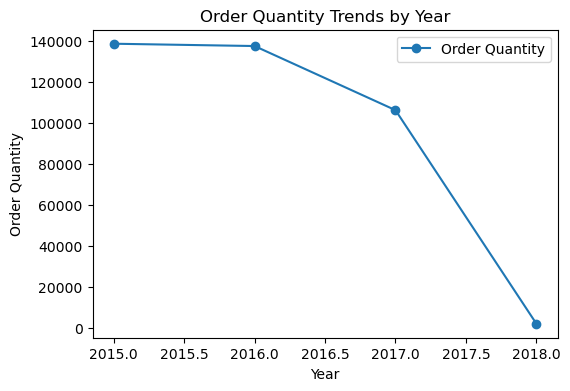

In [219]:
plt.figure(figsize=(6, 4))
plt.plot(b['year'],b['Order_quantity'], marker='o', linestyle='-', label='Order Quantity')
plt.xlabel('Year')
plt.ylabel('Order Quantity')
plt.title('Order Quantity Trends by Year')
plt.legend()
plt.show()



In [220]:
b=sales.groupby(by=['year']).agg(Sales=('sales',sum)).reset_index()

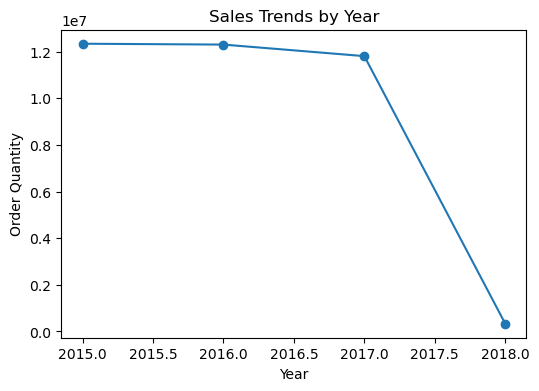

In [224]:
plt.figure(figsize=(6, 4))
plt.plot(b['year'],b['Sales'], marker='o', linestyle='-')
plt.xlabel('Year')
plt.ylabel('Order Quantity')
plt.title('Sales Trends by Year')
plt.show()

In [227]:
b=sales.groupby(by=['year']).agg(Profit=('order_profit_per_order',sum)).reset_index()

In [228]:
b

,year,Profit
0,2015,1.318857e+06
1,2016,1.310119e+06
2,2017,1.304085e+06
3,2018,3.384189e+04


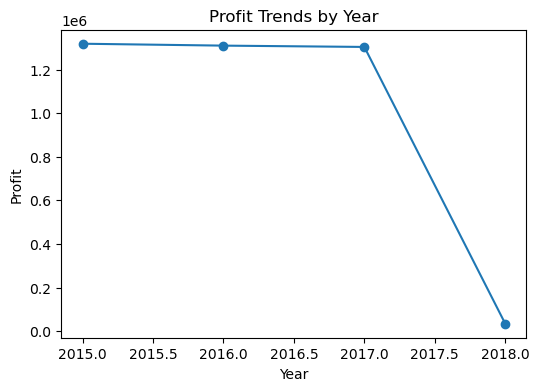

In [229]:
plt.figure(figsize=(6, 4))
plt.plot(b['year'],b['Profit'], marker='o', linestyle='-')
plt.xlabel('Year')
plt.ylabel('Profit')
plt.title('Profit Trends by Year')
plt.show()

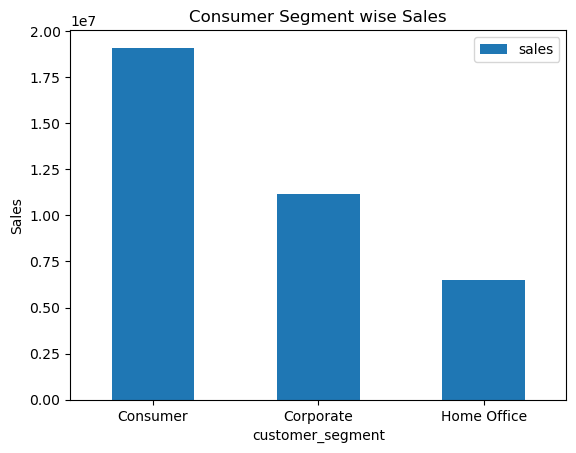

In [232]:
sales.groupby(by=['customer_segment']).agg(sales=('sales',sum)).plot(kind='bar')
plt.xticks(rotation=0)
plt.title("Consumer Segment wise Sales")
plt.ylabel("Sales")
plt.show()

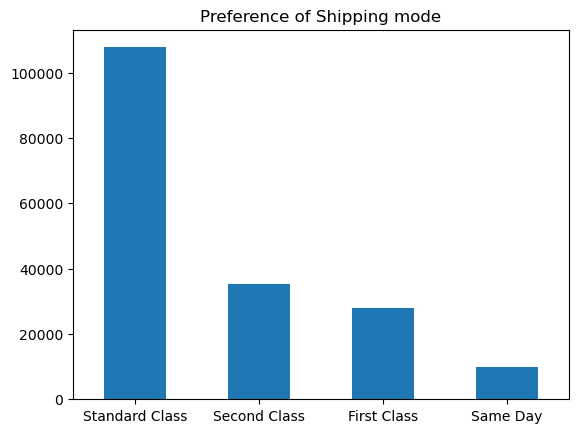

In [237]:
sales['shipping_mode'].value_counts().plot(kind='bar')
plt.xticks(rotation=0)
plt.title("Preference of Shipping mode")
plt.show()

# Predictive modeling

In [34]:
sales['class'].value_counts()

High Value-Small Number           67738
Moderate Value-Moderate Number    58781
Small Value-Large Number          54000
Name: class, dtype: int64

In [93]:
sales_new=sales.groupby(by=['customer_id','class','customer_segment']).agg(sales=('sales',sum),order_item_discount=('order_item_discount',sum),order_item_product_price=('order_item_product_price',sum),product_price=('product_price',sum)).reset_index()

In [94]:
sales_new

,customer_id,class,customer_segment,sales,order_item_discount,order_item_product_price,product_price
0,1,High Value-Small Number,Consumer,499.950012,27.500000,99.989998,99.989998
1,2,High Value-Small Number,Consumer,819.940025,78.600000,759.950024,759.950024
2,2,Moderate Value-Moderate Number,Consumer,449.980011,52.000000,449.980011,449.980011
3,2,Small Value-Large Number,Consumer,549.809997,70.469999,189.930000,189.930000
4,3,High Value-Small Number,Consumer,2479.760078,269.990002,1879.860058,1879.860058
...,...,...,...,...,...,...,...
43701,20753,Small Value-Large Number,Consumer,215.820007,53.959999,215.820007,215.820007
43702,20754,Small Value-Large Number,Consumer,215.820007,43.160000,215.820007,215.820007
43703,20755,Small Value-Large Number,Consumer,327.750000,13.110000,327.750000,327.750000
43704,20756,Small Value-Large Number,Corporate,11.540000,0.630000,11.540000,11.540000


In [95]:
#removing all the spaces from categorical colums so that no syntax error is there whilw making Formula for model

In [96]:
sales_new['class']=sales_new['class'].str.replace(" ", "_")

In [97]:
sales_new['customer_segment']=sales_new['customer_segment'].str.replace(" ", "_")

In [98]:
sales_new['sales']=round(sales_new['sales'],2)

In [99]:
sales_new.shape
# Linear Regression is possible to apply on a dataset which has more number of rows than columns
# R> C
#Hence condition is followed

(43706, 7)

In [100]:
#separate the categorical vs continuous variables
sales_continuous = sales_new.select_dtypes(include='number')
sales_categorical = sales_new.select_dtypes(include='object')

# creating the variables with column names
sales_cat_variables = sales_new.select_dtypes(include='number').columns
sales_conti_variables = sales_new.select_dtypes(include='object').columns

<Axes: >

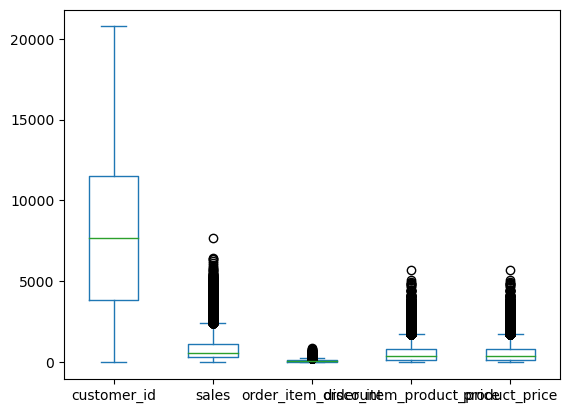

In [101]:
sales_continuous.plot(kind='box')
#Outlier Treatment is required

In [102]:
# Outlier Treatment
sales_continuous = sales_continuous.apply(lambda x: x.clip( lower = x.quantile(0.20), upper = x.quantile(0.80) ) )

<Axes: >

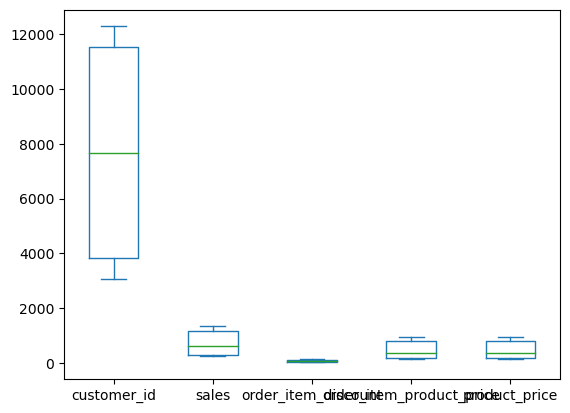

In [103]:
sales_continuous.plot(kind='box')

In [104]:
sales_categorical.isnull().sum().sum()
#No missing value Therfore missing value treatment is not required.

0

In [105]:
sales_categorical.head(3)

,class,customer_segment
0,High_Value-Small_Number,Consumer
1,High_Value-Small_Number,Consumer
2,Moderate_Value-Moderate_Number,Consumer


In [106]:
sales_conti_variables

Index(['class', 'customer_segment'], dtype='object')

In [107]:
# One- Hot Encoding technique (n-1) #get dummies(df, drop_first = False)
sales_categorical = pd.get_dummies(sales_categorical[['class', 'customer_segment']], drop_first = True )

In [108]:
sales_categorical.head(3)

,class_Moderate_Value-Moderate_Number,class_Small_Value-Large_Number,customer_segment_Corporate,customer_segment_Home_Office
0,0,0,0,0
1,0,0,0,0
2,1,0,0,0


In [109]:
# combine categorical and continuous datasets
sales_final = pd.concat([sales_categorical,sales_continuous], axis = 1 )

In [110]:
sales_final.head(3)

,class_Moderate_Value-Moderate_Number,class_Small_Value-Large_Number,customer_segment_Corporate,customer_segment_Home_Office,customer_id,sales,order_item_discount,order_item_product_price,product_price
0,0,0,0,0,3078,499.95,27.5,129.990005,129.990005
1,0,0,0,0,3078,819.94,78.6,759.950024,759.950024
2,1,0,0,0,3078,449.98,52.0,449.980011,449.980011


In [111]:
sales_final.columns = sales_final.columns.str.replace('-','_')

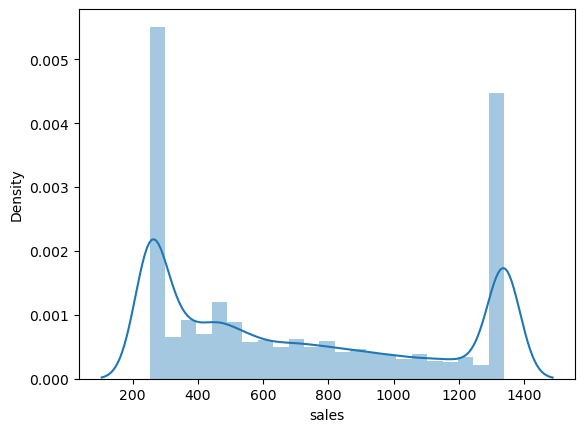

In [112]:
# Checking the normality assumption on Y variable
sns.distplot(sales_final.sales)
plt.show()

<Axes: xlabel='sales', ylabel='Density'>

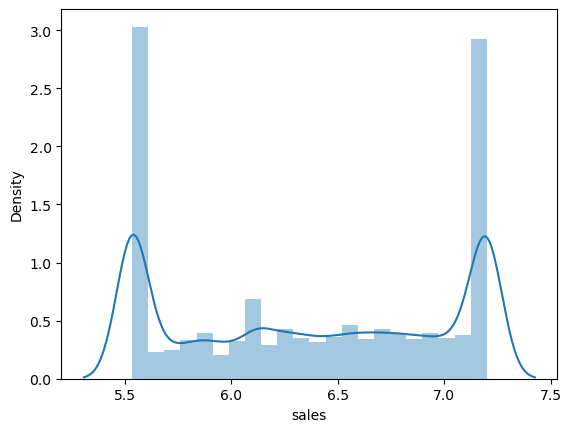

In [113]:
# If transformation is resulting in normal distribution, then that is best for the context
sns.distplot(np.log(sales_final.sales))

<Axes: xlabel='sales', ylabel='Density'>

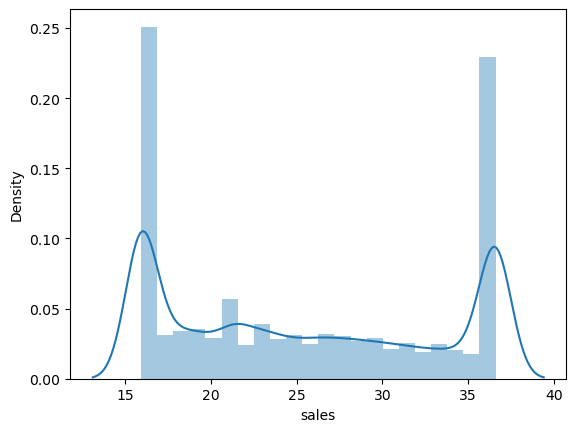

In [114]:
sns.distplot(np.sqrt(sales_final.sales))

In [115]:
# it in not following normal distribution after any transformation still we will proceed 

In [116]:
# splitting the data in test and train
train, test = train_test_split(sales_final, test_size = 0.2, random_state = 1 )

In [117]:
# Model Buliding Activity

In [118]:
X_vars = sales_final.columns.difference(['sales'])
y_var = 'sales'

In [119]:
# define the model equation
formula_lm = 'sales ~ ' + ' + '.join( X_vars )

In [120]:
formula_lm

'sales ~ class_Moderate_Value_Moderate_Number + class_Small_Value_Large_Number + customer_id + customer_segment_Corporate + customer_segment_Home_Office + order_item_discount + order_item_product_price + product_price'

In [121]:
# fiting the model 
lm_0 = smf.ols(formula_lm, train ).fit()

In [122]:
print(lm_0.summary())

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.892
Model:                            OLS   Adj. R-squared:                  0.892
Method:                 Least Squares   F-statistic:                 4.135e+04
Date:                Mon, 20 Nov 2023   Prob (F-statistic):               0.00
Time:                        11:34:20   Log-Likelihood:            -2.2175e+05
No. Observations:               34964   AIC:                         4.435e+05
Df Residuals:                   34956   BIC:                         4.436e+05
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [123]:
(lm_0.predict(train))

30459     895.622983
6954      863.854908
43685     388.560443
38134     274.414771
3185      349.255329
            ...     
7813      947.280634
32511    1314.346396
5192      955.405220
12172    1303.718209
33003     580.905106
Length: 34964, dtype: float64

In [124]:
# MSE - Mean squared Error
mse_train = mean_squared_error( train.sales, lm_0.predict(train))
mse_test = mean_squared_error( test.sales, lm_0.predict(test))
print( 'MSE: ', mse_train, mse_test)
print( 'RMSE: ', np.sqrt(mse_train), np.sqrt(mse_test))

MSE:  18896.716927235884 19155.440711659405
RMSE:  137.4653299098936 138.40318172520242


In [125]:
lm_1 = smf.ols(formula_lm, test ).fit()

In [126]:
print(lm_1.summary())

                            OLS Regression Results                            
Dep. Variable:                  sales   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.891
Method:                 Least Squares   F-statistic:                 1.021e+04
Date:                Mon, 20 Nov 2023   Prob (F-statistic):               0.00
Time:                        11:34:36   Log-Likelihood:                -55497.
No. Observations:                8742   AIC:                         1.110e+05
Df Residuals:                    8734   BIC:                         1.111e+05
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [127]:
sales_new['pred_sales']=pd.concat([lm_0.predict(train), lm_1.predict(test)]).sort_index()

In [ ]:
file_path='C:\\Users\\sudhi\\OneDrive\\Desktop\\Analytics Labs\\Data Engineer\\Python\\Integrated Case Study\\model_output.pkl'
sales_new.to_pickle(file_path)

In [128]:
sales_new

,customer_id,class,customer_segment,sales,order_item_discount,order_item_product_price,product_price,pred_sales
0,1,High_Value-Small_Number,Consumer,499.95,27.500000,99.989998,99.989998,334.616266
1,2,High_Value-Small_Number,Consumer,819.94,78.600000,759.950024,759.950024,1014.720729
2,2,Moderate_Value-Moderate_Number,Consumer,449.98,52.000000,449.980011,449.980011,612.297084
3,2,Small_Value-Large_Number,Consumer,549.81,70.469999,189.930000,189.930000,580.606235
4,3,High_Value-Small_Number,Consumer,2479.76,269.990002,1879.860058,1879.860058,1390.741008
...,...,...,...,...,...,...,...,...
43701,20753,Small_Value-Large_Number,Consumer,215.82,53.959999,215.820007,215.820007,447.420918
43702,20754,Small_Value-Large_Number,Consumer,215.82,43.160000,215.820007,215.820007,402.039117
43703,20755,Small_Value-Large_Number,Consumer,327.75,13.110000,327.750000,327.750000,391.688615
43704,20756,Small_Value-Large_Number,Corporate,11.54,0.630000,11.540000,11.540000,241.074411


In [129]:
sales_new.sales.kurtosis()

4.264753389164456

In [131]:
(sales_new.sales).skew()

1.8030185510053922